<Food Final>

In [1]:
import os

import torch

import torch.nn as nn

import torch.optim as optim

from torch.utils.data import Dataset, DataLoader

from torchvision import transforms, models

import numpy as np

import cv2

from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt

from torch.optim.lr_scheduler import ReduceLROnPlateau

import torch

from torch.utils.data import  DataLoader

from torchvision import datasets, transforms

import torchvision.transforms as transforms

In [2]:
BATCH_SIZE = 16
EPOCHS = 80

## data loaders

In [3]:
import cv2

import torch

from torchvision import transforms
class ConvertToLab:

    def __call__(self, image):

        # Convert PIL Image to NumPy array

        image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)  # Convert RGB to BGR

        lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)  # Convert BGR to Lab

        return transforms.ToPILImage()(lab_image)  # Convert back to PIL Image



transform = transforms.Compose([

    transforms.Resize((224, 224)),

    # ConvertToLab(),  # Custom transform to convert to Lab

    transforms.ToTensor(),

    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),

])


device = "cuda" if torch.cuda.is_available() else "cpu"
kwargs = {'num_workers': 1, 'pin_memory': True} if device=='cuda' else {}
train_dataset_path = 'ind_food_37/train'
valid_dataset_path = 'ind_food_37/val'

# test_dataset_path = 'split_augmented-70/test'



train_dataset = datasets.ImageFolder(train_dataset_path, transform=transform)

valid_dataset = datasets.ImageFolder(valid_dataset_path, transform=transform)

# test_dataset = datasets.ImageFolder(test_dataset_path,transform=transform)



train_dataloader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE,shuffle=True,**kwargs)

valid_dataloader = torch.utils.data.DataLoader(valid_dataset, batch_size=BATCH_SIZE,shuffle=True,**kwargs)

# test_dataloader =  torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=True, **kwargs)





CLASSES = train_dataset.classes

train_len = len(train_dataset)

valid_len = len(valid_dataset)

# test_len = len(test_dataset)

print(CLASSES)

['Aloo Puri', 'Bhakarwadi', 'Bhindi Masala', 'Biryani', 'Chhole Bhature', 'Dal Bati Churma', 'Dal Makhni', 'Dhokla', 'Dosa', 'Dum Aloo', 'Ghevar', 'Gulab Jamun', 'Idli Sambhar', 'Jalebi', 'Kachori', 'Khakhra', 'Khandvi', 'Kheer', 'Medu Vada', 'Modak', 'Mushroom', 'Nan Khatai', 'Paneer', 'Pani Puri', 'Pav Bhaji', 'Poha', 'Rajma Chawal', 'Rasgulla', 'Rasmalai', 'Samosa', 'Sarson ka Saag Makki ki Roti', 'Shrikhand', 'Siddu', 'Thepla', 'Thukpa', 'Uttapam', 'Vada Pav']


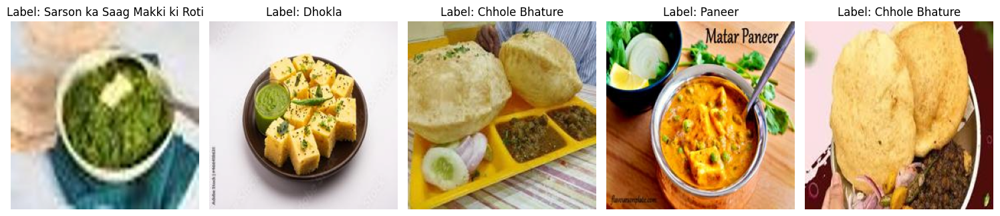

In [4]:
def plot_random_images(dataset, num_images=5):

    indices = np.random.choice(len(dataset), num_images, replace=False)

    

    plt.figure(figsize=(15, 6))

    for i, index in enumerate(indices):

        image, label = dataset[index]

        # Convert the tensor back to a NumPy array for plotting

        image = image.permute(1, 2, 0).numpy()  # Change dimensions from CxHxW to HxWxC

        image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Denormalize

        image = np.clip(image, 0, 1)  # Ensure pixel values are in [0, 1]

        

        plt.subplot(1, num_images, i + 1)

        plt.imshow(image)

        plt.title(f"Label: {dataset.classes[label]}")

        plt.axis('off')

    

    plt.tight_layout()

    plt.show()



# Plot random images from the training dataset

plot_random_images(train_dataset, num_images=5)

## Model

In [5]:
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import torchvision.models as models

# # Define a modified CNN with Dilated Convolution
# class DilatedCNN(nn.Module):
#     def __init__(self):
#         super(DilatedCNN, self).__init__()
#         self.conv1 = nn.Conv2d(3, 64, kernel_size=3, dilation=2, padding=2)
#         self.conv2 = nn.Conv2d(64, 128, kernel_size=3, dilation=2, padding=2)
#         self.conv3 = nn.Conv2d(128, 256, kernel_size=3, dilation=2, padding=2)
#         self.relu = nn.ReLU(inplace=True)
#         self.pool = nn.MaxPool2d(kernel_size=2, stride=2)

#     def forward(self, x):
#         # Avoid pooling too aggressively
#         x = self.relu(self.conv1(x))  # No pooling after the first conv layer
#         x = self.pool(self.relu(self.conv2(x)))  # First pooling here
#         x = self.relu(self.conv3(x))  # No pooling here
#         return x

# # Define the combined model with DenseNet
# class DilatedCNNWithModifiedDenseNet(nn.Module):
#     def __init__(self, densenet):
#         super(DilatedCNNWithModifiedDenseNet, self).__init__()
        
#         # Dilated CNN layers
#         self.dilated_cnn = DilatedCNN()
        
#         # DenseNet (pretrained or modified)
#         self.densenet = densenet
        
#     def forward(self, x):
#         # Pass through dilated CNN
#         x = self.dilated_cnn(x)
        
#         # Before feeding to DenseNet, ensure size compatibility
#         x = self.densenet(x)  # Pass through DenseNet

#         return x

# # Instantiate and modify DenseNet (for example, DenseNet121)
# densenet = models.densenet121(pretrained=True)

In [6]:
import math
import torch
import torch.nn as nn
import torchvision.models as models

class GhostModule(nn.Module):
    def __init__(self, inp, oup, kernel_size=1, ratio=2, dw_size=3, stride=1, relu=True):
        super(GhostModule, self).__init__()
        self.oup = oup
        init_channels = math.ceil(oup / ratio)
        new_channels = init_channels * (ratio - 1)

        self.primary_conv = nn.Sequential(
            nn.Conv2d(inp, init_channels, kernel_size, stride, kernel_size // 2, bias=False),
            nn.BatchNorm2d(init_channels),
            nn.ReLU(inplace=True) if relu else nn.Sequential(),
        )

        self.cheap_operation = nn.Sequential(
            nn.Conv2d(init_channels, new_channels, dw_size, 1, dw_size // 2, groups=init_channels, bias=False),
            nn.BatchNorm2d(new_channels),
            nn.ReLU(inplace=True) if relu else nn.Sequential(),
        )

    def forward(self, x):
        x1 = self.primary_conv(x)
        x2 = self.cheap_operation(x1)
        out = torch.cat([x1, x2], dim=1)
        return out[:, :self.oup, :, :]


class InceptionModule(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(InceptionModule, self).__init__()
        channels_per_branch = out_channels // 4
        self.branch1x1 = nn.Conv2d(in_channels, channels_per_branch, kernel_size=1)
        self.branch3x3 = nn.Sequential(
            nn.Conv2d(in_channels, channels_per_branch, kernel_size=1),
            nn.Conv2d(channels_per_branch, channels_per_branch, kernel_size=3, padding=1)
        )
        self.branch5x5 = nn.Sequential(
            nn.Conv2d(in_channels, channels_per_branch, kernel_size=1),
            nn.Conv2d(channels_per_branch, channels_per_branch, kernel_size=5, padding=2)
        )
        self.branch_pool = nn.Sequential(
            nn.MaxPool2d(kernel_size=3, stride=1, padding=1),
            nn.Conv2d(in_channels, channels_per_branch, kernel_size=1)
        )

    def forward(self, x):
        branch1x1 = self.branch1x1(x)
        branch3x3 = self.branch3x3(x)
        branch5x5 = self.branch5x5(x)
        branch_pool = self.branch_pool(x)
        outputs = [branch1x1, branch3x3, branch5x5, branch_pool]
        return torch.cat(outputs, 1)


class eca_layer(nn.Module):
    def __init__(self, channel, k_size=3):
        super(eca_layer, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.conv = nn.Conv1d(1, 1, kernel_size=k_size, padding=(k_size - 1) // 2, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        b, c, h, w = x.size()
        y = self.avg_pool(x)
        y = self.conv(y.squeeze(-1).transpose(-1, -2)).transpose(-1, -2).unsqueeze(-1)
        y = self.sigmoid(y)
        return x * y.expand_as(x)


class ChannelShuffle(nn.Module):
    def __init__(self, groups):
        super(ChannelShuffle, self).__init__()
        self.groups = groups

    def forward(self, x):
        batch_size, num_channels, height, width = x.size()
        channels_per_group = num_channels // self.groups
        x = x.view(batch_size, self.groups, channels_per_group, height, width)
        x = torch.transpose(x, 1, 2).contiguous()
        x = x.view(batch_size, -1, height, width)
        return x


class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, name, groups=2):
        super(ConvBlock, self).__init__()
        self.channel_shuffle = ChannelShuffle(groups)
        self.ghost = GhostModule(in_channels, out_channels)
        self.eca = eca_layer(out_channels)

    def forward(self, x):
        x = self.channel_shuffle(x)
        x = self.ghost(x)
        x = self.eca(x)
        return x


class FeatureFusion(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(FeatureFusion, self).__init__()
        self.se = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(in_channels, out_channels, 1),
            nn.Sigmoid()
        )

    def forward(self, x1, x2):
        fused = torch.cat((x1, x2), dim=1)
        weights = self.se(fused)
        return fused * weights


class DualTrackModel(nn.Module):
    def __init__(self, num_classes):
        super(DualTrackModel, self).__init__()
        # ResNet50 track
        self.resnet_track = models.resnet50(pretrained=True)
        self.resnet_track = nn.Sequential(*list(self.resnet_track.children())[:-2])

        # Track 2: Enhanced CNN with Ghost, ECA, and Inception modules
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3)
        self.bn1 = nn.BatchNorm2d(64)
        self.relu = nn.ReLU(inplace=True)
        self.maxpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.inception1 = InceptionModule(64, 128)
        self.block1 = ConvBlock(128, 256, 'block1')
        self.block2 = ConvBlock(256, 512, 'block2')
        self.final_conv = nn.Conv2d(512, 1024, kernel_size=1, padding=0)
        self.final_bn = nn.BatchNorm2d(1024)

        # Feature fusion layer
        total_features = 2048 + 1024  # ResNet50's output channels + enhanced CNN's output channels
        self.feature_fusion = FeatureFusion(total_features, total_features)
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))
        self.fc1 = nn.Linear(total_features, 1536)
        self.dropout1 = nn.Dropout(0.5)
        self.fc2 = nn.Linear(1536, 768)
        self.dropout2 = nn.Dropout(0.5)
        self.fc3 = nn.Linear(768, num_classes)

    def forward(self, x):
        # Track 1: ResNet50
        x1 = self.resnet_track(x)

        # Track 2: Enhanced CNN
        x2 = self.conv1(x)
        x2 = self.bn1(x2)
        x2 = self.relu(x2)
        x2 = self.maxpool(x2)
        x2 = self.inception1(x2)
        x2 = self.block1(x2)
        x2 = self.block2(x2)
        x2 = self.final_conv(x2)
        x2 = self.final_bn(x2)
        x2 = self.relu(x2)

        # Align feature maps sizes using adaptive pooling
        x1 = nn.AdaptiveAvgPool2d(x2.shape[2:])(x1)

        # Fusion of ResNet50 and CNN tracks
        fused = self.feature_fusion(x1, x2)

        # Global average pooling
        fused = self.global_avg_pool(fused)

        # Flatten and fully connected layers
        fused = torch.flatten(fused, 1)
        x = self.fc1(fused)
        x = self.relu(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.relu(x)
        x = self.dropout2(x)
        x = self.fc3(x)

        return x


In [7]:
model=DualTrackModel(num_classes=37)
import torchinfo
torchinfo.summary(model,(32,3,224,224))

/home/pranav/nvenv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/pranav/nvenv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Layer (type:depth-idx)                        Output Shape              Param #
DualTrackModel                                [32, 37]                  --
├─Sequential: 1-1                             [32, 2048, 7, 7]          --
│    └─Conv2d: 2-1                            [32, 64, 112, 112]        9,408
│    └─BatchNorm2d: 2-2                       [32, 64, 112, 112]        128
│    └─ReLU: 2-3                              [32, 64, 112, 112]        --
│    └─MaxPool2d: 2-4                         [32, 64, 56, 56]          --
│    └─Sequential: 2-5                        [32, 256, 56, 56]         --
│    │    └─Bottleneck: 3-1                   [32, 256, 56, 56]         75,008
│    │    └─Bottleneck: 3-2                   [32, 256, 56, 56]         70,400
│    │    └─Bottleneck: 3-3                   [32, 256, 56, 56]         70,400
│    └─Sequential: 2-6                        [32, 512, 28, 28]         --
│    │    └─Bottleneck: 3-4                   [32, 512, 28, 28]         379,392

## Training Func

In [8]:
def train_model(model, criterion, optimizer, scheduler,model_name, num_epochs=75, load_checkpoint=False, checkpoint_path=None):

    since = time.time()

    best_model_wts = copy.deepcopy(model.state_dict())

    best_acc = 0.0

    best_loss = float('inf')

    df_train = pd.DataFrame(columns=['epoch', 'train_loss', 'train_acc'])

    df_val = pd.DataFrame(columns=['epoch', 'val_loss', 'val_acc'])



    # Load checkpoint if specified

    if load_checkpoint:

        if checkpoint_path is None:

            raise ValueError("Checkpoint path is not specified.")



        checkpoint = torch.load(checkpoint_path)

        model.load_state_dict(checkpoint['model_state_dict'])

        optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

        start_epoch = checkpoint['epoch'] + 1

        print(f"Loaded checkpoint from epoch {start_epoch - 1}")

    else:

        start_epoch = 0



    for epoch in range(start_epoch, num_epochs):

        print(f'Epoch {epoch}/{num_epochs - 1}')

        print("-" * 10)



        if epoch == 0 and not os.path.isdir(model_name+"working/"):

            os.mkdir(model_name+"working/")



        for phase in ['train', 'val']:

            if phase == 'train':

                model.train()

            else:

                model.eval()



            running_loss = 0.0

            running_corrects = 0.0

            total_samples = 0



            progress_bar = tqdm(dataloaders[phase], desc=f'{phase.capitalize()} Epoch {epoch}/{num_epochs - 1}', leave=False)



            for inputs, labels in progress_bar:

                inputs = inputs.to(device)

                labels = labels.to(device)



                optimizer.zero_grad()



                with torch.set_grad_enabled(phase == 'train'):

                    outputs = model(inputs)

                    _, preds = torch.max(outputs, 1)

                    loss = criterion(outputs, labels)



                    if phase == 'train':

                        loss.backward()

                        # Gradient clipping

                        clip_grad_norm_(model.parameters(), max_norm=1.0)

                        optimizer.step()



                running_loss += loss.item() * inputs.size(0)

                running_corrects += torch.sum(preds == labels.data)

                total_samples += labels.size(0)



                accuracy = running_corrects.double() / total_samples

                progress_bar.set_postfix(loss=running_loss / total_samples, accuracy=accuracy)



            epoch_loss = running_loss / dataset_sizes[phase]

            epoch_acc = running_corrects.double() / dataset_sizes[phase]



            print(f"{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}")



            if phase == 'train':

                df_new_row = pd.DataFrame({'epoch': [epoch], 'train_loss': [epoch_loss], 'train_acc': [epoch_acc.cpu()]})

                df_train = pd.concat([df_train, df_new_row], ignore_index=True)

                df_train.to_csv(model_name+'train_metrics.csv', index=False)

            elif phase == 'val':

                df_new_row = pd.DataFrame({'epoch': [epoch], 'val_loss': [epoch_loss], 'val_acc': [epoch_acc.cpu()]})

                df_val = pd.concat([df_val, df_new_row], ignore_index=True)

                df_val.to_csv(model_name+'val_metrics.csv', index=False)



                # Learning rate scheduling

                scheduler.step(epoch_loss)



                # Check if the current validation loss is the best

                if epoch_loss < best_loss:

                    best_loss = epoch_loss

                    best_acc = epoch_acc

                    best_model_wts = copy.deepcopy(model.state_dict())



        # Save checkpoint every 9 epochs

        if epoch % 9 == 0:

            torch.save({

                'epoch': epoch,

                'model_state_dict': model.state_dict(),

                'optimizer_state_dict': optimizer.state_dict(),

                'loss': epoch_loss,

            }, f"{model_name}working/sav_model{epoch}.pt")



        print()



    time_elapsed = time.time() - since

    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')

    print(f"Best Val Acc: {best_acc:.4f}")



    model.load_state_dict(best_model_wts)

    return model, df_train, df_val

# Drivers

In [9]:


dataloaders = {

    "train": train_dataloader,

    "val": valid_dataloader,

    #"test": test_dataloader

}



dataset_sizes = {

    "train": train_len,

    "val": valid_len,

    #"test": test_len

}

In [10]:


def clear_gpu_vram():

    torch.cuda.empty_cache()

In [11]:
import time 

import copy

import pandas as pd

from tqdm import tqdm

from torch.nn.utils import clip_grad_norm_



# model_name = "deit"

# model, df_train, df_val = train_model(model, criterion, optimizer, exp_lr_scheduler,model_name, num_epochs=100, load_checkpoint=False, checkpoint_path=None)


In [12]:
import torchvision.transforms as transforms



class ConvertToLab:

    def __call__(self, image):

        # Convert PIL Image to NumPy array

        image = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)  # Convert RGB to BGR

        lab_image = cv2.cvtColor(image, cv2.COLOR_BGR2Lab)  # Convert BGR to Lab

        return transforms.ToPILImage()(lab_image)  # Convert back to PIL Image



transform = transforms.Compose([

    transforms.Resize((224, 224)),

    # ConvertToLab(),  # Custom transform to convert to Lab

    transforms.ToTensor(),

    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),

])









test_dataset_path = 'ind_food_37/test'






# Create a test dataset

test_dataset = datasets.ImageFolder(test_dataset_path, transform=transform)



# Create a test dataloader

test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=16, shuffle=False)  # Set shuffle to False

CLASSES = test_dataset.classes



test_len = len(test_dataset)

print(CLASSES)

['Aloo Puri', 'Bhakarwadi', 'Bhindi Masala', 'Biryani', 'Chhole Bhature', 'Dal Bati Churma', 'Dal Makhni', 'Dhokla', 'Dosa', 'Dum Aloo', 'Ghevar', 'Gulab Jamun', 'Idli Sambhar', 'Jalebi', 'Kachori', 'Khakhra', 'Khandvi', 'Kheer', 'Medu Vada', 'Modak', 'Mushroom', 'Nan Khatai', 'Paneer', 'Pani Puri', 'Pav Bhaji', 'Poha', 'Rajma Chawal', 'Rasgulla', 'Rasmalai', 'Samosa', 'Sarson ka Saag Makki ki Roti', 'Shrikhand', 'Siddu', 'Thepla', 'Thukpa', 'Uttapam', 'Vada Pav']


In [14]:
# dataloaders = {

#     "test": test_dataloader

# }



# dataset_sizes = {

#     "test": test_len

# }


***Do Not run***

In [99]:
# Main loop to run all models sequentially

from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support

import torchvision

import torchvision.transforms as transforms

models_to_run = ['resnet50']

def count_parameters(model):

    return sum(p.numel() for p in model.parameters() if p.requires_grad)

for model_name in models_to_run:

    print(f"\nRunning {model_name}...\n")

    # Get the model, loss function, and optimizer

#     # Define your model

#     device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# # Instantiate the model and move it to the appropriate device (GPU or CPU)
# # Initialize DenseNet and modify input channels
#     densenet = torchvision.models.densenet121(pretrained=False)
    
#     # Modify the first convolutional layer to accept the correct number of channels
#     densenet.features.conv0 = nn.Conv2d(256, 64, kernel_size=7, stride=2, padding=3, bias=False)
    
    # Now, pass this modified DenseNet to the DilatedCNNWithModifiedDenseNet
    model = DualTrackModel(num_classes=37).to(device)
  # Check for multiple GPUs and use DataParallel if available


    num_params = count_parameters(model)

    print(f"Total number of trainable parameters in {model_name} : {num_params}")

    # optimizer = optim.Adam(model.parameters(), lr=0.001)

    

    optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)

    criterion = nn.CrossEntropyLoss()

    # optimizer = SWATS(model.parameters(), lr=0.001)

    exp_lr_scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.2, patience=3, min_lr=1e-6)

        

    # Train the model

    model, df_train, df_val = train_model(model, criterion, optimizer, exp_lr_scheduler,model_name, num_epochs=EPOCHS, load_checkpoint=False, checkpoint_path=None)

    torch.save(model.state_dict(), model_name+'best_model_weights.pth')

    # Evaluate the model

    # evaluate_model(model,model_name)

    model.eval()

    # Assuming you have 'test_dataloader', 'test_dataset', 'device', 'model', and 'criterion' defined

    

    # checkpoint = torch.load('densenetbest_model_weights.pth')

    # model.load_state_dict(checkpoint)

    

    

    

    running_corrects = 0

    test_loss = 0

    class_correct = [0] * len(test_dataset.classes)

    class_total = [0] * len(test_dataset.classes)

    

    # Lists to store true and predicted labels

    all_true_labels = []

    all_pred_labels = []

    

    with torch.no_grad():

        for inputs, labels in test_dataloader:

            inputs = inputs.to(device)

            labels = labels.to(device)

    

            outputs = model(inputs)

            _, preds = torch.max(outputs, 1)

    

            running_corrects += torch.sum(preds == labels.data)

            loss = criterion(outputs, labels)

            test_loss += loss.item() * inputs.size(0)

    

            for i in range(len(labels)):

                label = labels[i].item()

                class_correct[label] += int(preds[i] == label)

                class_total[label] += 1

    

                # Collect true and predicted labels

                all_true_labels.append(label)

                all_pred_labels.append(preds[i].item())

    

    # Calculate metrics

    test_acc = running_corrects.double() / len(test_dataset)

    test_loss = test_loss / len(test_dataset)

    

    # Overall accuracy

    overall_accuracy = accuracy_score(all_true_labels, all_pred_labels)

    

    # Precision, recall, and F1 score

    precision, recall, f1_score, _ = precision_recall_fscore_support(all_true_labels, all_pred_labels, average='weighted')

    

    classification_report_str = classification_report(all_true_labels, all_pred_labels, target_names=test_dataset.classes)

    

    print(f"Test Accuracy: {test_acc:.4f}")

    print(f"Test Loss: {test_loss:.4f}")

    print(f"Overall Accuracy: {overall_accuracy:.4f}")

    print(f"Overall Precision: {precision:.4f}")

    print(f"Overall Recall: {recall:.4f}")

    print(f"Overall F1 Score: {f1_score:.4f}")

    print("Classification Report:")

    print(classification_report_str)

    

    # Calculate and print class-wise accuracy

    for i, class_name in enumerate(test_dataset.classes):

        class_acc = class_correct[i] / class_total[i]

        print(f"Class {class_name} Accuracy: {class_acc:.4f}")

    num_params = count_parameters(model)

    print(f"Total number of trainable parameters in {model_name} : {num_params}")



    

    # Clear GPU VRAM
 
    del model

    clear_gpu_vram()



Running resnet50...

Total number of trainable parameters in resnet50 : 39544363
Epoch 0/79
----------


/tmp/ipykernel_109/2904183932.py:143: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_train = pd.concat([df_train, df_new_row], ignore_index=True)


train Loss: 3.5911 Acc: 0.0435


/tmp/ipykernel_109/2904183932.py:151: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  df_val = pd.concat([df_val, df_new_row], ignore_index=True)


val Loss: 3.5658 Acc: 0.0375

Epoch 1/79
----------


train Loss: 3.5383 Acc: 0.0606


val Loss: 3.5181 Acc: 0.0531

Epoch 2/79
----------


train Loss: 3.4856 Acc: 0.0658


val Loss: 3.4477 Acc: 0.0632

Epoch 3/79
----------


train Loss: 3.3971 Acc: 0.0875


val Loss: 3.3031 Acc: 0.0769

Epoch 4/79
----------


train Loss: 3.2615 Acc: 0.1179


val Loss: 3.1461 Acc: 0.1932

Epoch 5/79
----------


train Loss: 3.1177 Acc: 0.1736


val Loss: 2.9920 Acc: 0.2198

Epoch 6/79
----------


train Loss: 2.9882 Acc: 0.2031


val Loss: 2.8368 Acc: 0.2427

Epoch 7/79
----------


train Loss: 2.8487 Acc: 0.2264


val Loss: 2.6846 Acc: 0.2665

Epoch 8/79
----------


train Loss: 2.7198 Acc: 0.2527


val Loss: 2.5499 Acc: 0.3205

Epoch 9/79
----------


train Loss: 2.5845 Acc: 0.2818


val Loss: 2.3990 Acc: 0.3892

Epoch 10/79
----------


train Loss: 2.4515 Acc: 0.3311


val Loss: 2.2514 Acc: 0.4304

Epoch 11/79
----------


train Loss: 2.3132 Acc: 0.3599


val Loss: 2.0689 Acc: 0.4771

Epoch 12/79
----------


train Loss: 2.1568 Acc: 0.4173


val Loss: 1.9179 Acc: 0.5055

Epoch 13/79
----------


train Loss: 2.0495 Acc: 0.4425


val Loss: 1.7817 Acc: 0.5440

Epoch 14/79
----------


train Loss: 1.9243 Acc: 0.4715


val Loss: 1.6313 Acc: 0.5659

Epoch 15/79
----------


train Loss: 1.7872 Acc: 0.5015


val Loss: 1.5003 Acc: 0.5888

Epoch 16/79
----------


train Loss: 1.6752 Acc: 0.5284


val Loss: 1.4039 Acc: 0.6227

Epoch 17/79
----------


train Loss: 1.5730 Acc: 0.5630


val Loss: 1.2960 Acc: 0.6630

Epoch 18/79
----------


train Loss: 1.4556 Acc: 0.5893


val Loss: 1.2196 Acc: 0.6685

Epoch 19/79
----------


train Loss: 1.3599 Acc: 0.6107


val Loss: 1.1116 Acc: 0.7115

Epoch 20/79
----------


train Loss: 1.2963 Acc: 0.6359


val Loss: 1.0522 Acc: 0.7308

Epoch 21/79
----------


train Loss: 1.1950 Acc: 0.6631


val Loss: 0.9858 Acc: 0.7436

Epoch 22/79
----------


train Loss: 1.1504 Acc: 0.6758


val Loss: 0.9213 Acc: 0.7747

Epoch 23/79
----------


train Loss: 1.0646 Acc: 0.7035


val Loss: 0.8662 Acc: 0.7930

Epoch 24/79
----------


train Loss: 1.0216 Acc: 0.7135


val Loss: 0.8106 Acc: 0.8077

Epoch 25/79
----------


train Loss: 0.9295 Acc: 0.7431


val Loss: 0.7648 Acc: 0.8223

Epoch 26/79
----------


train Loss: 0.8940 Acc: 0.7526


val Loss: 0.7389 Acc: 0.8333

Epoch 27/79
----------


train Loss: 0.8324 Acc: 0.7628


val Loss: 0.6716 Acc: 0.8443

Epoch 28/79
----------


train Loss: 0.7830 Acc: 0.7877


val Loss: 0.6390 Acc: 0.8590

Epoch 29/79
----------


train Loss: 0.7419 Acc: 0.7942


val Loss: 0.6063 Acc: 0.8553

Epoch 30/79
----------


train Loss: 0.6796 Acc: 0.8197


val Loss: 0.5837 Acc: 0.8663

Epoch 31/79
----------


train Loss: 0.6542 Acc: 0.8267


val Loss: 0.5320 Acc: 0.8709

Epoch 32/79
----------


train Loss: 0.6090 Acc: 0.8344


val Loss: 0.5006 Acc: 0.8892

Epoch 33/79
----------


train Loss: 0.5478 Acc: 0.8514


val Loss: 0.4747 Acc: 0.8938

Epoch 34/79
----------


train Loss: 0.5496 Acc: 0.8555


val Loss: 0.4538 Acc: 0.8919

Epoch 35/79
----------


train Loss: 0.4949 Acc: 0.8713


val Loss: 0.4175 Acc: 0.8984

Epoch 36/79
----------


train Loss: 0.4596 Acc: 0.8821


val Loss: 0.4045 Acc: 0.9103

Epoch 37/79
----------


train Loss: 0.4292 Acc: 0.8915


val Loss: 0.4025 Acc: 0.9048

Epoch 38/79
----------


train Loss: 0.4115 Acc: 0.8917


val Loss: 0.3724 Acc: 0.9103

Epoch 39/79
----------


train Loss: 0.3866 Acc: 0.8980


val Loss: 0.3773 Acc: 0.9130

Epoch 40/79
----------


train Loss: 0.3543 Acc: 0.9109


val Loss: 0.3534 Acc: 0.9222

Epoch 41/79
----------


train Loss: 0.3261 Acc: 0.9177


val Loss: 0.3355 Acc: 0.9212

Epoch 42/79
----------


train Loss: 0.3137 Acc: 0.9184


val Loss: 0.3368 Acc: 0.9240

Epoch 43/79
----------


train Loss: 0.2811 Acc: 0.9298


val Loss: 0.3109 Acc: 0.9286

Epoch 44/79
----------


train Loss: 0.2626 Acc: 0.9314


val Loss: 0.3109 Acc: 0.9258

Epoch 45/79
----------


train Loss: 0.2495 Acc: 0.9381


val Loss: 0.3088 Acc: 0.9304

Epoch 46/79
----------


train Loss: 0.2435 Acc: 0.9390


val Loss: 0.3070 Acc: 0.9286

Epoch 47/79
----------


train Loss: 0.2166 Acc: 0.9449


val Loss: 0.2923 Acc: 0.9295

Epoch 48/79
----------


train Loss: 0.1948 Acc: 0.9502


val Loss: 0.3014 Acc: 0.9295

Epoch 49/79
----------


train Loss: 0.1889 Acc: 0.9542


val Loss: 0.2891 Acc: 0.9304

Epoch 50/79
----------


train Loss: 0.1866 Acc: 0.9546


val Loss: 0.2728 Acc: 0.9277

Epoch 51/79
----------


train Loss: 0.1791 Acc: 0.9565


val Loss: 0.2773 Acc: 0.9295

Epoch 52/79
----------


train Loss: 0.1570 Acc: 0.9597


val Loss: 0.2705 Acc: 0.9341

Epoch 53/79
----------


train Loss: 0.1524 Acc: 0.9625


val Loss: 0.2773 Acc: 0.9341

Epoch 54/79
----------


train Loss: 0.1402 Acc: 0.9660


val Loss: 0.2709 Acc: 0.9341

Epoch 55/79
----------


train Loss: 0.1267 Acc: 0.9690


val Loss: 0.2770 Acc: 0.9341

Epoch 56/79
----------


train Loss: 0.1252 Acc: 0.9709


val Loss: 0.2737 Acc: 0.9295

Epoch 57/79
----------


train Loss: 0.1104 Acc: 0.9727


val Loss: 0.2615 Acc: 0.9341

Epoch 58/79
----------


train Loss: 0.1075 Acc: 0.9762


val Loss: 0.2783 Acc: 0.9368

Epoch 59/79
----------


train Loss: 0.1115 Acc: 0.9704


val Loss: 0.2603 Acc: 0.9396

Epoch 60/79
----------


train Loss: 0.0990 Acc: 0.9791


val Loss: 0.2577 Acc: 0.9350

Epoch 61/79
----------


train Loss: 0.1096 Acc: 0.9724


val Loss: 0.2745 Acc: 0.9368

Epoch 62/79
----------


train Loss: 0.1047 Acc: 0.9746


val Loss: 0.2609 Acc: 0.9322

Epoch 63/79
----------


train Loss: 0.1035 Acc: 0.9764


val Loss: 0.2595 Acc: 0.9322

Epoch 64/79
----------


train Loss: 0.0965 Acc: 0.9774


val Loss: 0.2788 Acc: 0.9322

Epoch 65/79
----------


train Loss: 0.0923 Acc: 0.9804


val Loss: 0.2577 Acc: 0.9359

Epoch 66/79
----------


train Loss: 0.0879 Acc: 0.9817


val Loss: 0.2588 Acc: 0.9341

Epoch 67/79
----------


train Loss: 0.0955 Acc: 0.9785


val Loss: 0.2574 Acc: 0.9368

Epoch 68/79
----------


train Loss: 0.1020 Acc: 0.9746


val Loss: 0.2743 Acc: 0.9304

Epoch 69/79
----------


train Loss: 0.0954 Acc: 0.9791


val Loss: 0.2656 Acc: 0.9341

Epoch 70/79
----------


train Loss: 0.1050 Acc: 0.9717


val Loss: 0.2579 Acc: 0.9332

Epoch 71/79
----------


train Loss: 0.1016 Acc: 0.9746


val Loss: 0.2643 Acc: 0.9341

Epoch 72/79
----------


train Loss: 0.1024 Acc: 0.9761


val Loss: 0.2640 Acc: 0.9368

Epoch 73/79
----------


train Loss: 0.1001 Acc: 0.9766


val Loss: 0.2513 Acc: 0.9386

Epoch 74/79
----------


train Loss: 0.0865 Acc: 0.9816


val Loss: 0.2563 Acc: 0.9368

Epoch 75/79
----------


train Loss: 0.1013 Acc: 0.9741


val Loss: 0.2616 Acc: 0.9332

Epoch 76/79
----------


train Loss: 0.0907 Acc: 0.9783


val Loss: 0.2689 Acc: 0.9377

Epoch 77/79
----------


train Loss: 0.0957 Acc: 0.9766


val Loss: 0.2578 Acc: 0.9350

Epoch 78/79
----------


train Loss: 0.1016 Acc: 0.9753


val Loss: 0.2590 Acc: 0.9350

Epoch 79/79
----------


train Loss: 0.0929 Acc: 0.9801


val Loss: 0.2714 Acc: 0.9332

Training complete in 263m 11s
Best Val Acc: 0.9386
Test Accuracy: 0.9365
Test Loss: 0.2698
Overall Accuracy: 0.9365
Overall Precision: 0.9386
Overall Recall: 0.9365
Overall F1 Score: 0.9361
Classification Report:
                              precision    recall  f1-score   support

                   Aloo Puri       0.95      0.78      0.86        23
                  Bhakarwadi       1.00      0.95      0.97        19
               Bhindi Masala       0.94      0.89      0.91        35
                     Biryani       1.00      0.98      0.99        43
              Chhole Bhature       0.98      0.98      0.98        46
             Dal Bati Churma       0.94      0.78      0.85        40
                  Dal Makhni       0.85      1.00      0.92        23
                      Dhokla       0.97      0.95      0.96        38
                        Dosa       0.97      1.00      0.99        33
                    Dum Aloo       0.87      0.96      0

In [13]:
import torch
import torchvision.datasets as datasets
import torchvision.transforms as transforms

# Define the transformations
test_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    # ConvertToLab(),  # Custom transform to convert to Lab

    transforms.ToTensor(),

    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

test_dataset_path = 'ind_food_37/test'

# Create a test dataset
test_dataset = datasets.ImageFolder(test_dataset_path, transform=test_transform)

# Create a test dataloader
test_dataloader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False)  # Set shuffle to False


In [14]:
dataloaders = {
    "test": test_dataloader
}

dataset_sizes = 37


In [15]:
torchinfo.summary(model,(32,3,224,224))

Layer (type:depth-idx)                        Output Shape              Param #
DualTrackModel                                [32, 37]                  --
├─Sequential: 1-1                             [32, 2048, 7, 7]          --
│    └─Conv2d: 2-1                            [32, 64, 112, 112]        9,408
│    └─BatchNorm2d: 2-2                       [32, 64, 112, 112]        128
│    └─ReLU: 2-3                              [32, 64, 112, 112]        --
│    └─MaxPool2d: 2-4                         [32, 64, 56, 56]          --
│    └─Sequential: 2-5                        [32, 256, 56, 56]         --
│    │    └─Bottleneck: 3-1                   [32, 256, 56, 56]         75,008
│    │    └─Bottleneck: 3-2                   [32, 256, 56, 56]         70,400
│    │    └─Bottleneck: 3-3                   [32, 256, 56, 56]         70,400
│    └─Sequential: 2-6                        [32, 512, 28, 28]         --
│    │    └─Bottleneck: 3-4                   [32, 512, 28, 28]         379,392

In [16]:
import torch
import torch.nn as nn
import numpy as np
from sklearn.metrics import classification_report, accuracy_score

# Assuming you have 'test_dataloader', 'test_dataset', 'device', 'model', and 'criterion' defined

checkpoint = torch.load('resnet50best_model_weights.pth')
model.load_state_dict(checkpoint)

model.eval()
criterion = nn.CrossEntropyLoss()

model.to(device)

running_corrects = 0
test_loss = 0
class_correct = [0] * len(test_dataset.classes)
class_total = [0] * len(test_dataset.classes)

# Lists to store true and predicted labels
all_true_labels = []
all_pred_labels = []

with torch.no_grad():
    for inputs, labels in test_dataloader:
        inputs = inputs.to(device)
        labels = labels.to(device)

        outputs = model(inputs)
        _, preds = torch.max(outputs, 1)

        running_corrects += torch.sum(preds == labels.data)
        loss = criterion(outputs, labels)
        test_loss += loss.item() * inputs.size(0)

        for i in range(len(labels)):
            label = labels[i].item()
            class_correct[label] += int(preds[i] == label)
            class_total[label] += 1

            # Collect true and predicted labels
            all_true_labels.append(label)
            all_pred_labels.append(preds[i].item())

# Calculate metrics
test_acc = running_corrects.double() / len(test_dataset)
test_loss = test_loss / len(test_dataset)

overall_accuracy = accuracy_score(all_true_labels, all_pred_labels)
classification_report_str = classification_report(all_true_labels, all_pred_labels, target_names=test_dataset.classes)

print(f"Test Accuracy: {test_acc:.4f}")
print(f"Test Loss: {test_loss:.4f}")
print(f"Overall Accuracy: {overall_accuracy:.4f}")
print("Classification Report:")
print(classification_report_str)

# Calculate and print class-wise accuracy
for i, class_name in enumerate(test_dataset.classes):
    class_acc = class_correct[i] / class_total[i]
    print(f"Class {class_name} Accuracy: {class_acc:.4f}")

/tmp/ipykernel_1008/594350507.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load('resnet50best_model_weights.pth')


Test Accuracy: 0.9365
Test Loss: 0.2698
Overall Accuracy: 0.9365
Classification Report:
                              precision    recall  f1-score   support

                   Aloo Puri       0.95      0.78      0.86        23
                  Bhakarwadi       1.00      0.95      0.97        19
               Bhindi Masala       0.94      0.89      0.91        35
                     Biryani       1.00      0.98      0.99        43
              Chhole Bhature       0.98      0.98      0.98        46
             Dal Bati Churma       0.94      0.78      0.85        40
                  Dal Makhni       0.85      1.00      0.92        23
                      Dhokla       0.97      0.95      0.96        38
                        Dosa       0.97      1.00      0.99        33
                    Dum Aloo       0.87      0.96      0.92        28
                      Ghevar       0.90      0.97      0.93        29
                 Gulab Jamun       0.94      0.97      0.96        35
 

In [17]:
import torch

# Instantiate the model
model = DualTrackModel(num_classes=37)

# Load the saved weights
weights_path = 'resnet50best_model_weights.pth'
state_dict = torch.load(weights_path)

# Load the state dictionary into the model
model.load_state_dict(state_dict)

# Set the model to evaluation mode
model.eval()


/home/pranav/nvenv/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/pranav/nvenv/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_1008/1631845144.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-mode

DualTrackModel(
  (resnet_track): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (4): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0):

In [15]:
import torch.nn as nn

model.eval()  # Set model to evaluation mode

# Call the function with the instantiated model
predicted_dish, ingredients = predict_dish_with_flexible_matching(model, image_path, input_transform, CLASSES, dish_dataset)


NameError: name 'predict_dish_with_flexible_matching' is not defined

Enter the path to the image for prediction:  dosa3.jpg


The predicted dish is: Dosa
Ingredients: idli dosa batter,salt,buttermilk sour,sesame (gingelly) oil,curry leaves,poha (flattened rice),soda,rice,beetroot,green chilli paste,butter loni (white butter)


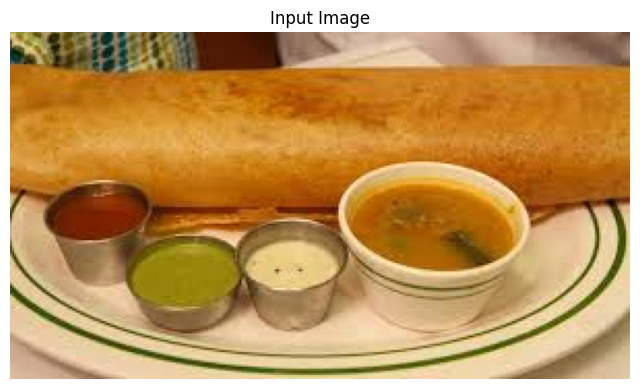


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
       gingelly seeds, black (sesamum indicum)              6  4.51±0.44 19.17±0.64 5.78±0.22 43.10±0.03 17.16±0.19 13.57±0.13 3.59±0.13   10.29±0.74  2124±8
       gingelly seeds, brown (sesamum indicum)              4  3.62±0.32 21.61±0.71 4.58±0.13 43.22±0.08 17.21±0.18 13.58±0.18 3.63±0.11    9.76±1.01  2161±8
       gingelly seeds, white (sesamum indicum)              5  3.30±0.28 21.70±0.44 4.13±0.16 43.05±0.04 16.99±0.30 13.49±0.19 3.51±0.15   10.83±0.50  2174±9
               curry leaves (murraya koenigii)              6 65.33±1.57  7.41±0.26 4.86±0.58  1.06±0.04 16.83±0.78 13.81±0.43 3.02±0.44    4.51±1.79  266±32
                    rice flakes (oryza sativa)              6 10.36±0.53  7.44±0.35 0.85±0.13  1.14±0.11  3.46±0.32  2.65±0.34 0.81±0.12   76.75±0.96 1480±16
                   ric

In [23]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from typing import List, Tuple
from PIL import Image
import torch
import torchvision.transforms as transforms

# Image transformation pipeline
input_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

def process_ingredient(Ingredient: str) -> List[str]:
    """
    Process an ingredient string, separating out bracketed parts if necessary.

    Args:
        ingredient: The ingredient string.

    Returns:
        A list of processed ingredient parts.
    """
    ingredient = Ingredient.strip()
    parts = re.split(r'\(|\)', ingredient)
    return [part.strip() for part in parts if part.strip()]

def match_ingredient_details(ingredient: str, detailed_dataset: pd.DataFrame) -> pd.DataFrame:
    """
    Match an ingredient with the detailed dataset and retrieve rows with the most matched data.

    Args:
        ingredient: The ingredient to match.
        detailed_dataset: DataFrame containing detailed ingredient information.

    Returns:
        DataFrame containing rows with the most matches or a fallback match.
    """
    ingredient = ingredient.lower()
    detailed_dataset.iloc[:, 0] = detailed_dataset.iloc[:, 0].fillna("").astype(str).str.lower()

    # Match rows containing the exact or partial ingredient match
    matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(ingredient) + r'\b', na=False)]

    # If no matches, try matching based on the first word of the ingredient
    if matched_rows.empty:
        first_word = ingredient.split()[0]
        matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(first_word) + r'\b', na=False)]

    return matched_rows

def predict_dish_with_flexible_matching(model, image_path, transform, class_names, dataset):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)  # Move model to device
    model.eval()

    # Load and preprocess the image
    image = Image.open(image_path).convert("RGB")
    image = transform(image).unsqueeze(0)  # Add batch dimension
    image = image.to(device)  # Move image to device

    with torch.no_grad():
        outputs = model(image)
        #print(outputs)# Get model predictions
        _, predicted_class_idx = torch.max(outputs, 1)  # Get the index of the highest probability

    predicted_dish_name = class_names[predicted_class_idx.item()]  # Map index to class name

    # Match the predicted dish name with the dataset
    matched_rows = dataset[dataset['dish-name'].str.contains(predicted_dish_name, case=False, na=False)]

    if not matched_rows.empty:
        ingredients = matched_rows.iloc[0]['Ingredients']  # Extract ingredients
    else:
        ingredients = "Ingredients not found in the dataset."

    return predicted_dish_name, ingredients


def display_image_and_ingredients(image_path: str, matched_df: pd.DataFrame):
    """
    Display the input image and the matched ingredient details in a structured format.

    Args:
        image_path: Path to the input image.
        matched_df: DataFrame containing matched ingredient details.
    """
    # Display the image
    try:
        img = mpimg.imread(image_path)
        plt.figure(figsize=(8, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title("Input Image")
        plt.show()
    except Exception as e:
        print(f"Error displaying image: {e}")

    # Display the matched ingredient details
    if not matched_df.empty:
        print("\nMatched Ingredient Details:\n")
        print(matched_df.to_string(index=False))
    else:
        print("\nNo matching ingredient details found.\n")

# Load the datasets
dataset_path = 'dish_ing.csv'  # Update with the path to your dish dataset
detailed_dataset_path = 'ing_nutrit.csv'  # Update with the path to your detailed ingredient dataset

dish_dataset = pd.read_csv(dataset_path)
detailed_dataset = pd.read_csv(detailed_dataset_path)

# Ensure the dish dataset has the required columns
required_columns = {'dish-name', 'Ingredients', 'Ingredient-count'}
if not required_columns.issubset(dish_dataset.columns):
    raise ValueError(f"Dish dataset must contain the following columns: {required_columns}")

# Ensure the detailed ingredient dataset has at least one column for ingredient names
if detailed_dataset.shape[1] < 1:
    raise ValueError("Detailed dataset must have at least one column for 'ing_name'.")

# User Input for Prediction
image_path = input("Enter the path to the image for prediction: ").strip()

# Predict the dish and retrieve ingredients
predicted_dish, ingredients = predict_dish_with_flexible_matching(model, image_path, input_transform, CLASSES, dish_dataset)

# Display the predicted dish
print(f"The predicted dish is: {predicted_dish}")
print(f"Ingredients: {ingredients}")

# Process and match each ingredient
ingredient_details = []
if ingredients != "No matching dish found in the dataset.":
    for ingredient in ingredients.split(','):
        parts = process_ingredient(ingredient)  # Process the ingredient
        for part in parts:
            matched_rows = match_ingredient_details(part, detailed_dataset)
            if not matched_rows.empty:
                ingredient_details.extend(matched_rows.head(3).to_dict(orient='records'))  # Limit to 3 rows

# Convert matched details to a DataFrame
matched_df = pd.DataFrame(ingredient_details) if ingredient_details else pd.DataFrame()

# Display the image and matched ingredient details
display_image_and_ingredients(image_path, matched_df)



In [26]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from typing import List, Tuple
from PIL import Image
import torch

input_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

def process_ingredient(ingredient: str) -> List[str]:
    """
    Process an ingredient string, separating out bracketed parts if necessary.

    Args:
        ingredient: The ingredient string.

    Returns:
        A list of processed ingredient parts.
    """
    ingredient = ingredient.strip()
    if '(' in ingredient and ')' in ingredient:
        main_part = ingredient.split('(')[0].strip()
        bracket_part = ingredient.split('(')[1].split(')')[0].strip()
        return [main_part, bracket_part]
    else:
        return [ingredient]


def match_ingredient_details(ingredient: str, detailed_dataset: pd.DataFrame) -> pd.DataFrame:
    """
    Match an ingredient with the detailed dataset and retrieve rows with the most matched data.
    If no exact or partial match is found, return rows that match the first word of the ingredient.

    Args:
        ingredient: The ingredient to match.
        detailed_dataset: DataFrame containing detailed ingredient information.

    Returns:
        DataFrame containing rows with the most matches or a fallback match.
    """
    ingredient = ingredient.lower()
    detailed_dataset.iloc[:, 0] = detailed_dataset.iloc[:, 0].fillna("").astype(str).str.lower()

    # Match rows containing the exact or partial ingredient match
    matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(ingredient) + r'\b', na=False)]

    # If no matches, try matching based on the first word of the ingredient
    if matched_rows.empty:
        first_word = ingredient.split()[0]
        matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(first_word) + r'\b', na=False)]

    return matched_rows


def predict_dish_with_flexible_matching(model, image_path: str, transform, class_names: list, dataset: pd.DataFrame) -> Tuple[str, str]:
    """
    Predict the dish class for a given image and find ingredients flexibly.

    Args:
        model: Trained PyTorch model.
        image_path: Path to the input image.
        transform: Transformations to apply to the input image.
        class_names: List of class names corresponding to model outputs.
        dataset: DataFrame containing dish names, ingredients, and ingredient counts.

    Returns:
        Predicted dish name and its corresponding ingredients.
    """
    model.eval()  # Set the model to evaluation mode

    # Load and preprocess the image
    image = Image.open(image_path).convert('RGB')  # Ensure the image is RGB
    image = transform(image).unsqueeze(0)  # Apply transformations and add batch dimension

    # Move the image to the appropriate device
    image = image.to(device)

    with torch.no_grad():
        outputs = model(image)  # Get model predictions
        _, predicted_class_idx = torch.max(outputs, 1)  # Get the index of the highest probability

    predicted_dish_name = class_names[predicted_class_idx.item()]  # Map index to class name

    # Match the predicted dish name with the dataset
    matched_rows = dataset[dataset['dish-name'].str.contains(predicted_dish_name, case=False, na=False)]

    if matched_rows.empty:
        return predicted_dish_name, "No matching dish found in the dataset."

    # Prioritize rows with the lowest ingredient count
    best_match = matched_rows.loc[matched_rows['Ingredient-count'].idxmin()]
    ingredients = best_match['Ingredients']

    return predicted_dish_name, ingredients


def display_image_and_ingredients(image_path: str, matched_df: pd.DataFrame):
    """
    Display the input image and the matched ingredient details in a structured format.

    Args:
        image_path: Path to the input image.
        matched_df: DataFrame containing matched ingredient details.
    """
    # Display the image
    img = mpimg.imread(image_path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title("Input Image")
    plt.show()

    # Display the matched ingredient details
    if not matched_df.empty:
        print("\nMatched Ingredient Details:\n")
        print(matched_df.to_string(index=False))
    else:
        print("\nNo matching ingredient details found.\n")


# Load the datasets
dataset_path = 'dish_ing.csv'  # Update with the path to your dish dataset
detailed_dataset_path = 'ing_nutrit.csv'  # Update with the path to your detailed ingredient dataset

dish_dataset = pd.read_csv(dataset_path)
detailed_dataset = pd.read_csv(detailed_dataset_path)

# Ensure the dish dataset has the required columns
required_columns = {'dish-name', 'Ingredients', 'Ingredient-count'}
if not required_columns.issubset(dish_dataset.columns):
    raise ValueError(f"Dish dataset must contain the following columns: {required_columns}")

# Ensure the detailed ingredient dataset has at least one column for ingredient names
if detailed_dataset.shape[1] < 1:
    raise ValueError("Detailed dataset must have at least one column for 'ing_name'.")

# User Input for Prediction
print("Enter the path to the image for prediction:")
image_path = input().strip()  # Get the image path from the user

# Predict the dish and retrieve ingredients
predicted_dish, ingredients = predict_dish_with_flexible_matching(model, image_path, input_transform, CLASSES, dish_dataset)

# Display the predicted dish
print(f"The predicted dish is: {predicted_dish}")
print(f"Ingredients: {ingredients}")

# Process and match each ingredient
ingredient_details = []

if ingredients != "No matching dish found in the dataset.":
    for ingredient in ingredients.split(','):
        # Process the ingredient to extract main and bracketed parts
        parts = process_ingredient(ingredient)

        for part in parts:
            # Match each part against the detailed dataset
            matched_rows = match_ingredient_details(part, detailed_dataset)

            if not matched_rows.empty:
                # Limit to a maximum of 3 matched rows
                limited_rows = matched_rows.head(3)  # Take the first 3 rows
                for _, row in limited_rows.iterrows():
                    ingredient_details.append(row.to_dict())

# Convert matched details to a DataFrame
if ingredient_details:
    matched_df = pd.DataFrame(ingredient_details)
else:
    matched_df = pd.DataFrame()



Enter the path to the image for prediction:


 pp.jpg


The predicted dish is: Pani Puri
Ingredients: green moong dal black gram,sweet chutney (date tamarind),pani puris,green chutney (coriander mint),boondi


Enter the path to the video file:


 dish2.mp4


Frame 0: Predicted dish - Samosa
Ingredients: salt,rice paper rolls,green peas (matar),onion,cumin seeds (jeera),potato (aloo),butter,garam masala powder


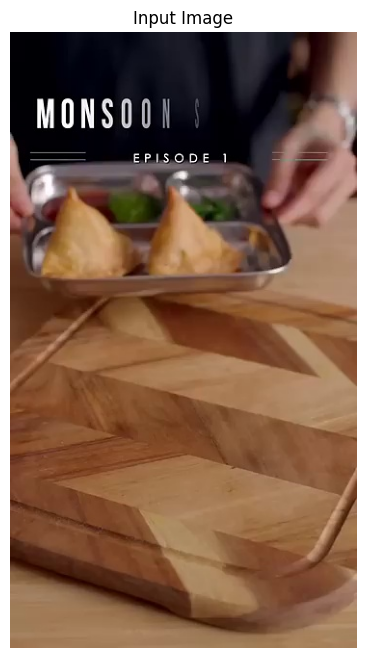


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    rice flakes (oryza sativa)              6 10.36±0.53  7.44±0.35 0.85±0.13  1.14±0.11  3.46±0.32  2.65±0.34 0.81±0.12   76.75±0.96 1480±16
                   rice puffed (oryza sativa )              6  9.40±0.22  7.47±0.15 1.28±0.10  1.62±0.13  2.56±0.33  1.76±0.13 0.80±0.38   77.68±0.54  1514±4
              rice, raw, brown (oryza sativa )              6  9.33±0.39  9.16±0.75 1.04±0.18  1.24±0.08  4.43±0.54  3.60±0.55 0.82±0.15   74.80±0.85 1480±10
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green

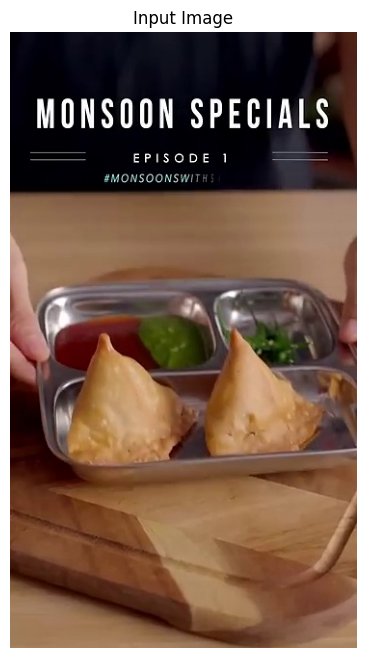


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    rice flakes (oryza sativa)              6 10.36±0.53  7.44±0.35 0.85±0.13  1.14±0.11  3.46±0.32  2.65±0.34 0.81±0.12   76.75±0.96 1480±16
                   rice puffed (oryza sativa )              6  9.40±0.22  7.47±0.15 1.28±0.10  1.62±0.13  2.56±0.33  1.76±0.13 0.80±0.38   77.68±0.54  1514±4
              rice, raw, brown (oryza sativa )              6  9.33±0.39  9.16±0.75 1.04±0.18  1.24±0.08  4.43±0.54  3.60±0.55 0.82±0.15   74.80±0.85 1480±10
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green

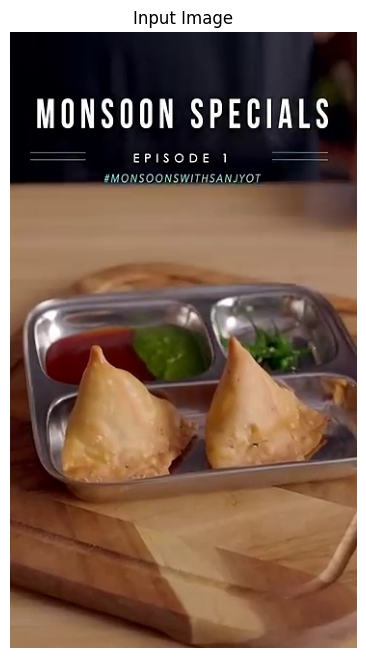


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    rice flakes (oryza sativa)              6 10.36±0.53  7.44±0.35 0.85±0.13  1.14±0.11  3.46±0.32  2.65±0.34 0.81±0.12   76.75±0.96 1480±16
                   rice puffed (oryza sativa )              6  9.40±0.22  7.47±0.15 1.28±0.10  1.62±0.13  2.56±0.33  1.76±0.13 0.80±0.38   77.68±0.54  1514±4
              rice, raw, brown (oryza sativa )              6  9.33±0.39  9.16±0.75 1.04±0.18  1.24±0.08  4.43±0.54  3.60±0.55 0.82±0.15   74.80±0.85 1480±10
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green

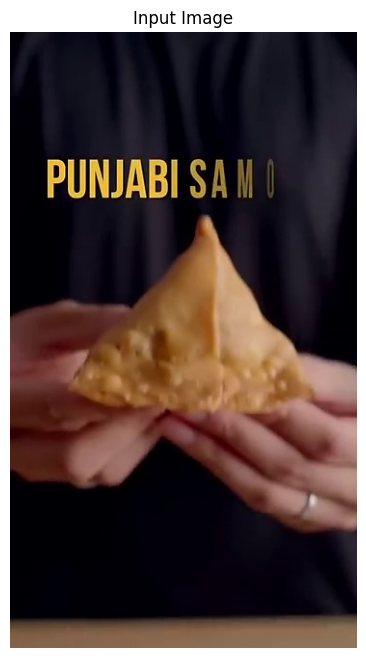


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    rice flakes (oryza sativa)              6 10.36±0.53  7.44±0.35 0.85±0.13  1.14±0.11  3.46±0.32  2.65±0.34 0.81±0.12   76.75±0.96 1480±16
                   rice puffed (oryza sativa )              6  9.40±0.22  7.47±0.15 1.28±0.10  1.62±0.13  2.56±0.33  1.76±0.13 0.80±0.38   77.68±0.54  1514±4
              rice, raw, brown (oryza sativa )              6  9.33±0.39  9.16±0.75 1.04±0.18  1.24±0.08  4.43±0.54  3.60±0.55 0.82±0.15   74.80±0.85 1480±10
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green

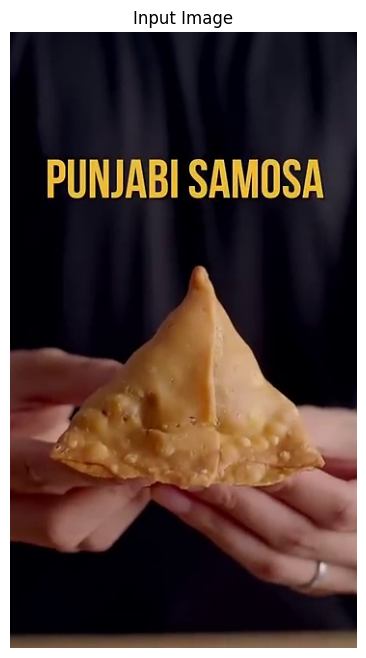


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    rice flakes (oryza sativa)              6 10.36±0.53  7.44±0.35 0.85±0.13  1.14±0.11  3.46±0.32  2.65±0.34 0.81±0.12   76.75±0.96 1480±16
                   rice puffed (oryza sativa )              6  9.40±0.22  7.47±0.15 1.28±0.10  1.62±0.13  2.56±0.33  1.76±0.13 0.80±0.38   77.68±0.54  1514±4
              rice, raw, brown (oryza sativa )              6  9.33±0.39  9.16±0.75 1.04±0.18  1.24±0.08  4.43±0.54  3.60±0.55 0.82±0.15   74.80±0.85 1480±10
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green

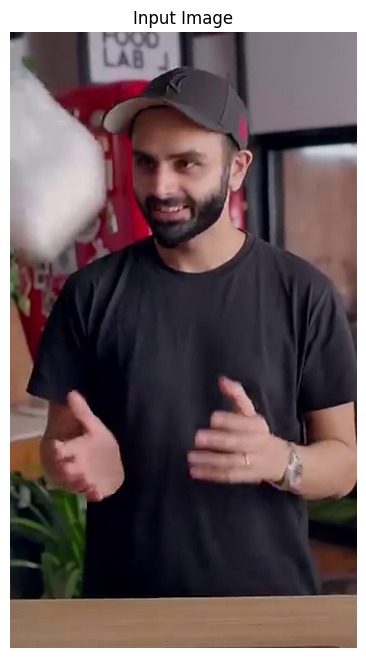


No matching ingredient details found.

Frame 150: Predicted dish - Rasgulla
Ingredients: pistachios,milk,rose water,rasgulla syrup,rasgulla,custard powder


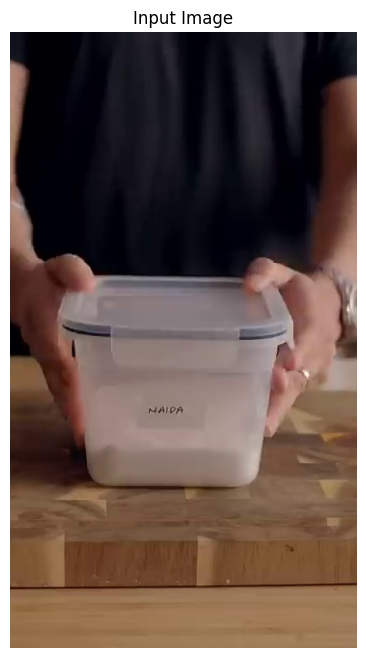


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 175: Predicted dish - Siddu
Ingredients: No matching dish found in the dataset.


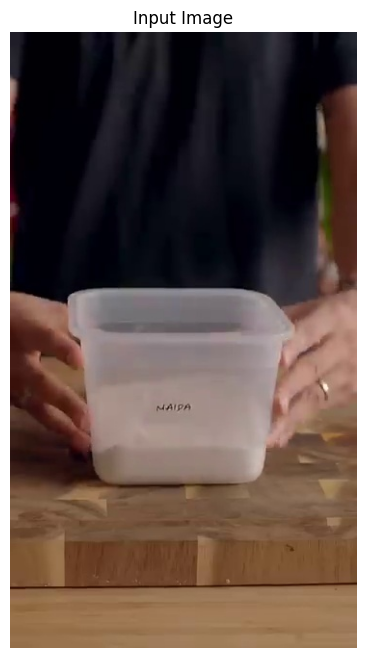


No matching ingredient details found.

Frame 200: Predicted dish - Rasmalai
Ingredients: cardamom (elaichi) podsseeds,mixed nuts like flaked almonds pistachios,milk,sugar,lemon,condensed milk


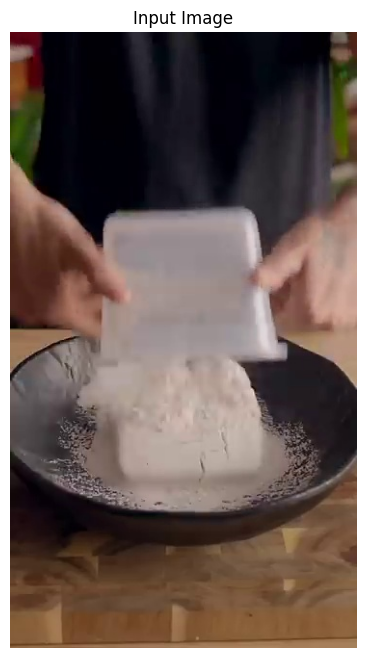


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

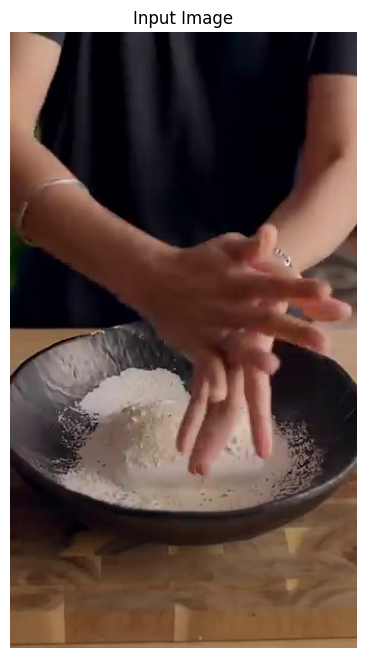


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

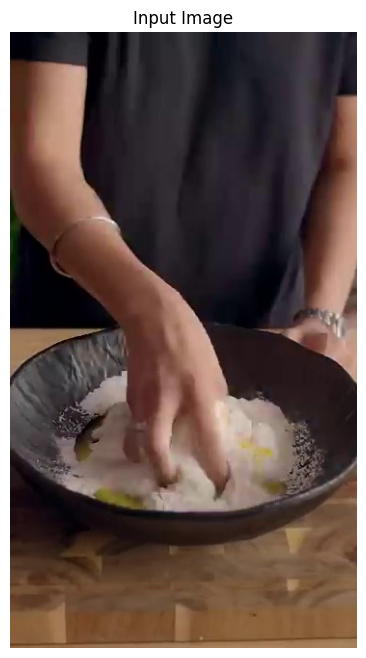


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 275: Predicted dish - Modak
Ingredients: salt,coconut,jaggery,water,cardamom powder (elaichi),rice flour,sunflower oil


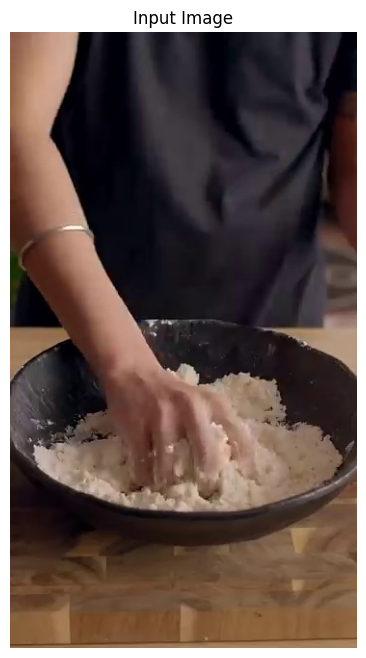


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

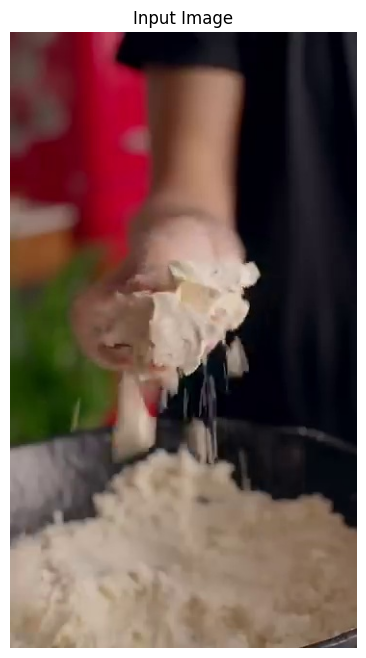


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

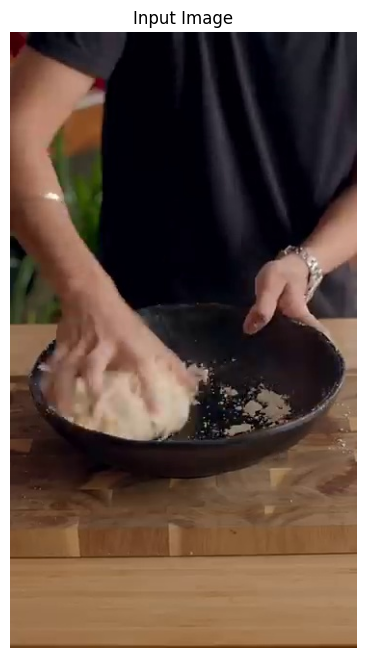


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

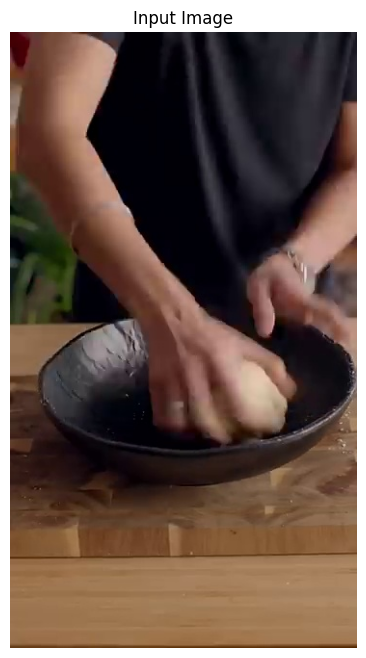


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 375: Predicted dish - Rasgulla
Ingredients: pistachios,milk,rose water,rasgulla syrup,rasgulla,custard powder


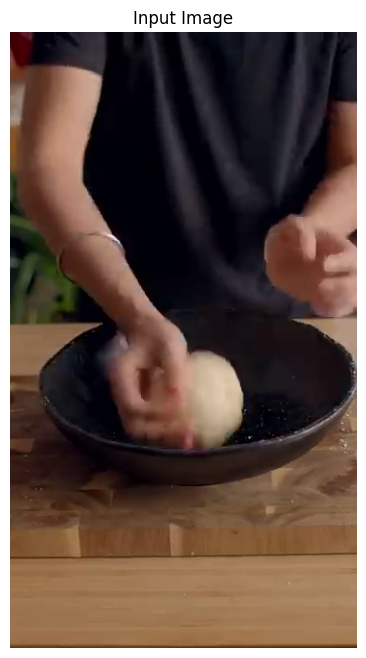


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 400: Predicted dish - Modak
Ingredients: salt,coconut,jaggery,water,cardamom powder (elaichi),rice flour,sunflower oil


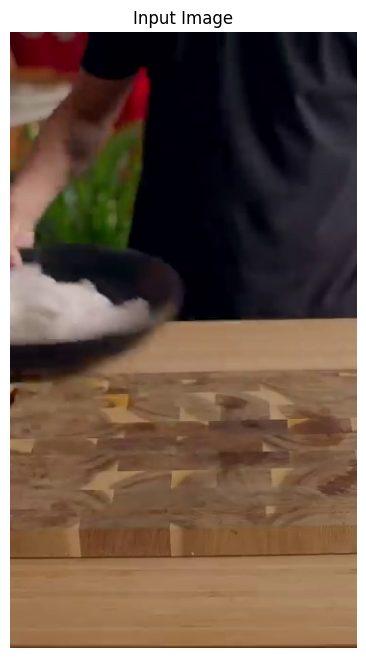


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

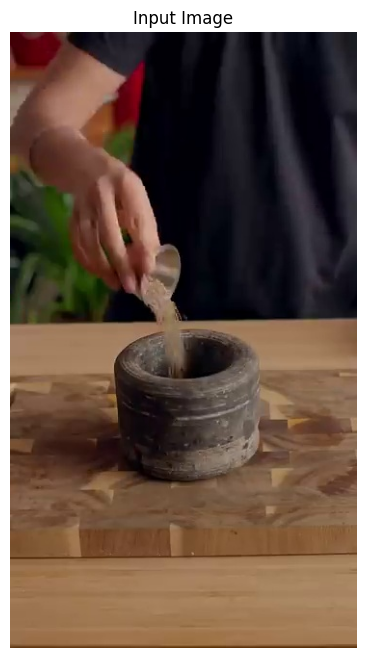


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 450: Predicted dish - Siddu
Ingredients: No matching dish found in the dataset.


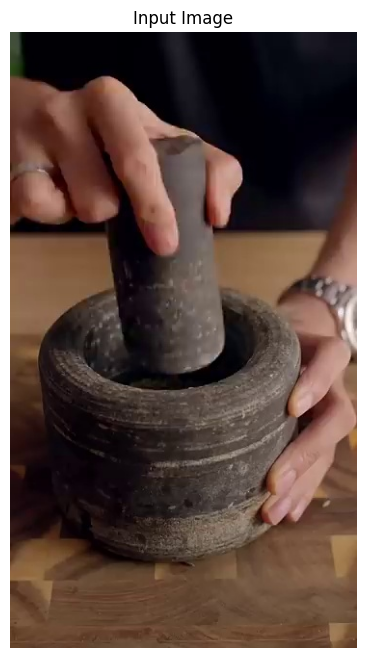


No matching ingredient details found.

Frame 475: Predicted dish - Siddu
Ingredients: No matching dish found in the dataset.


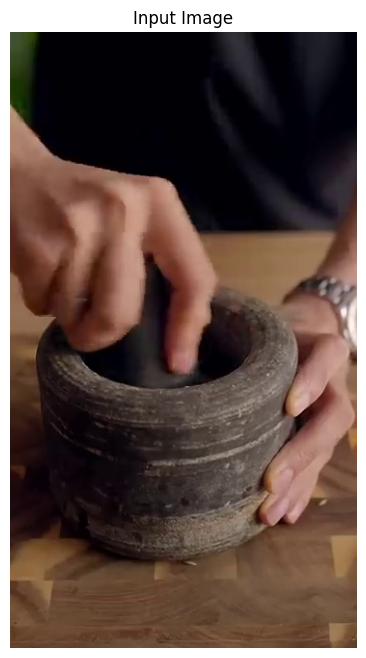


No matching ingredient details found.

Frame 500: Predicted dish - Siddu
Ingredients: No matching dish found in the dataset.


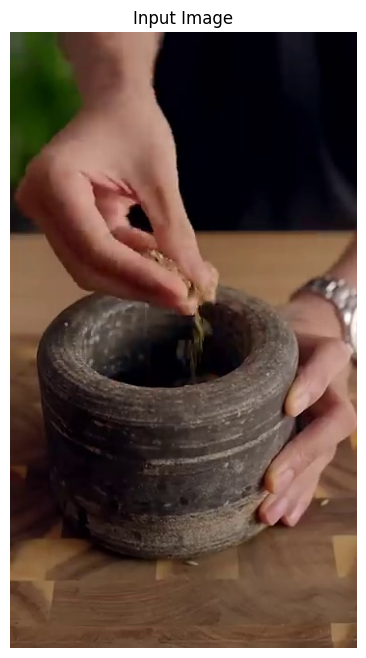


No matching ingredient details found.

Frame 525: Predicted dish - Pani Puri
Ingredients: green moong dal black gram,sweet chutney (date tamarind),pani puris,green chutney (coriander mint),boondi


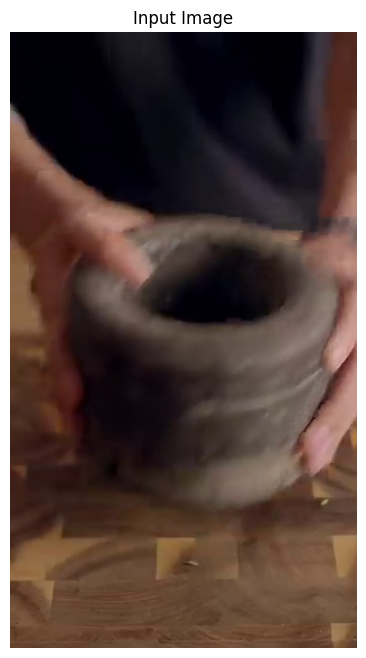


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green (amaranthus gangeticus)              6 86.85±1.21  3.29±0.57 2.52±0.32  0.65±0.07  4.41±0.10  3.21±0.08 1.20±0.09    2.28±0.62  128±17
               maize, tender, sweet (zea mays)              4 74.40±0.71  4.16±0.41 0.36±0.06  1.35±0.07  3.30±0.51  2.71±0.53 0.59±0.11   16.42±0.89  405±14
             lime, sweet,pulp (citrus limetta)              6 91.32±0.33  0.76±0.09 0.47±0.03  0.20±0.06  2.07±0.11  1.33±0.04 0.74±0.08    5.18±0.37   114±5
    sweet potato, brow

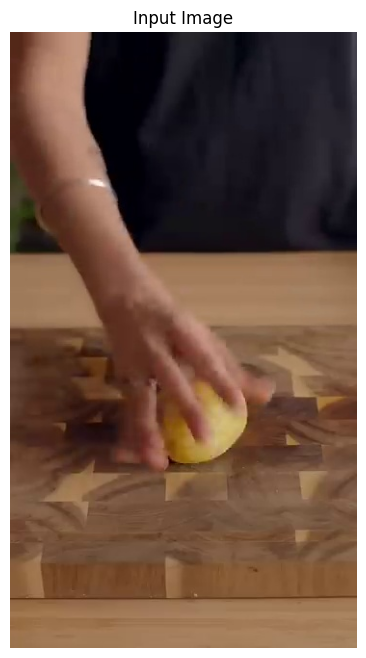


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

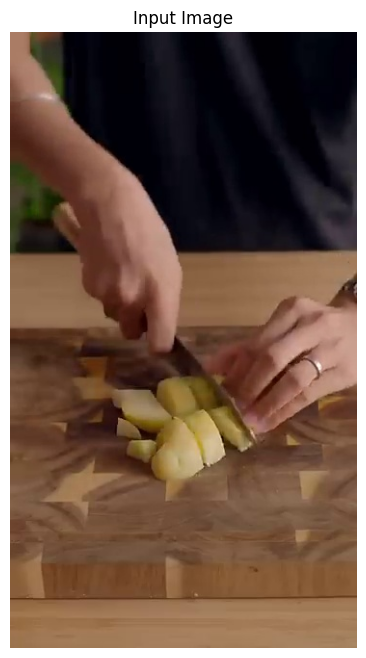


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

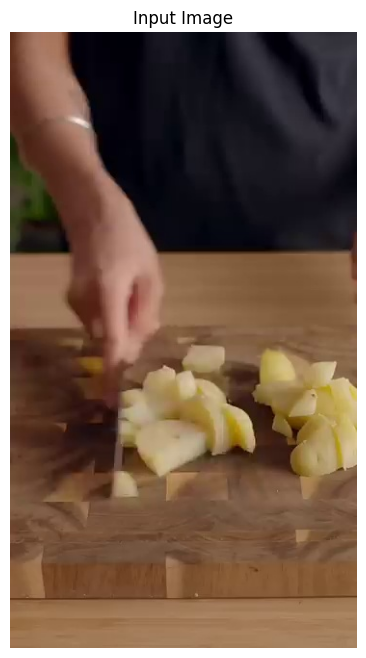


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

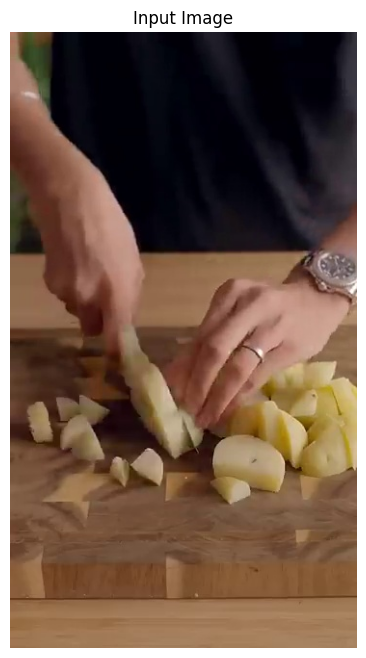


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

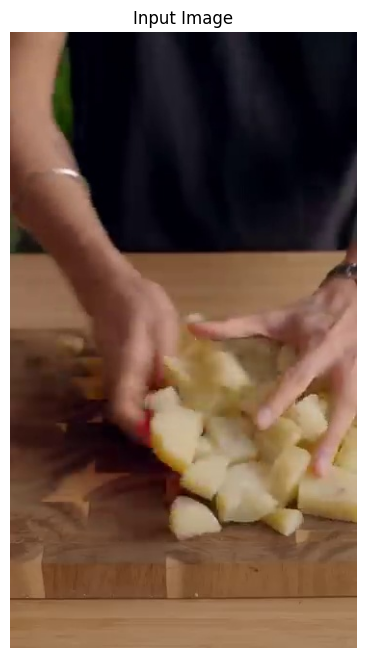


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

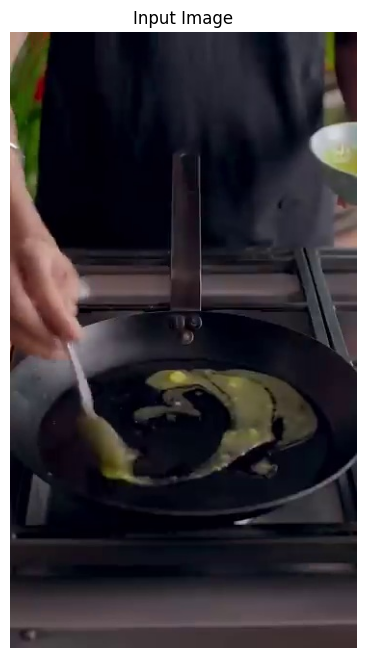


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

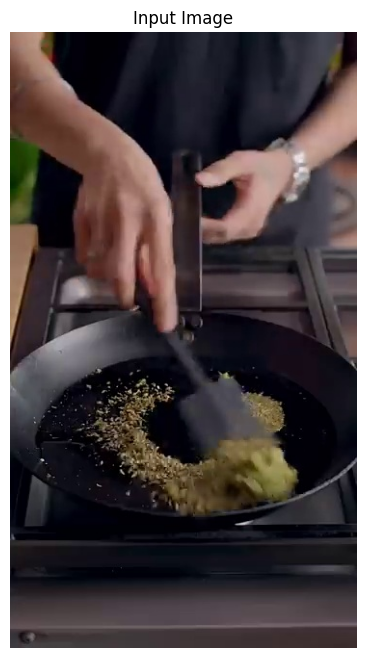


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

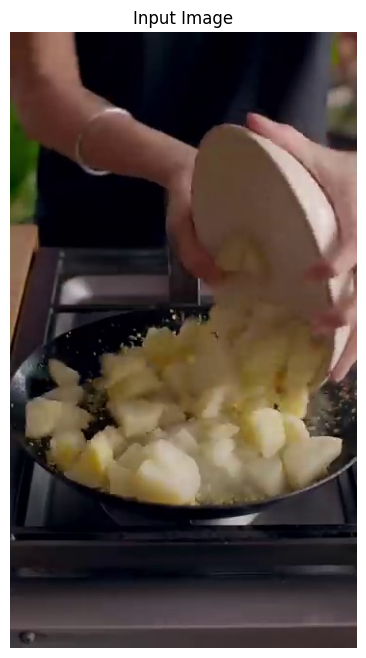


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 750: Predicted dish - Rasgulla
Ingredients: pistachios,milk,rose water,rasgulla syrup,rasgulla,custard powder


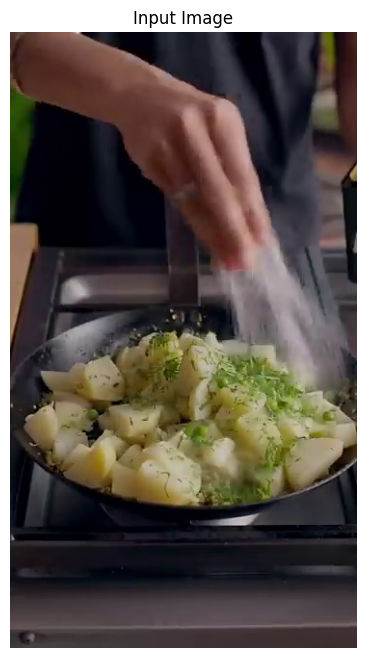


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 775: Predicted dish - Rasmalai
Ingredients: cardamom (elaichi) podsseeds,mixed nuts like flaked almonds pistachios,milk,sugar,lemon,condensed milk


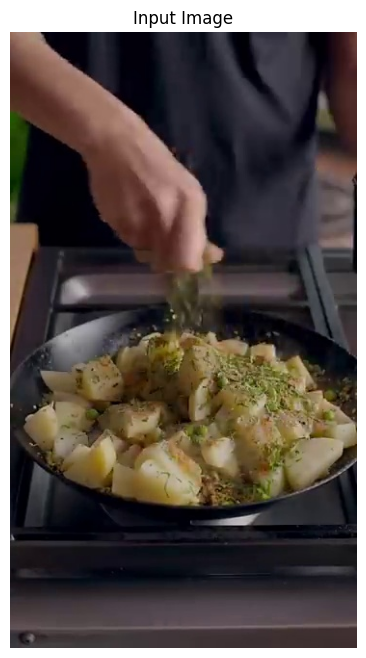


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

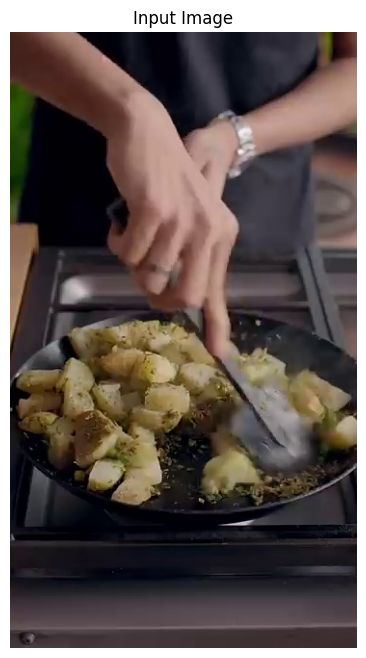


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

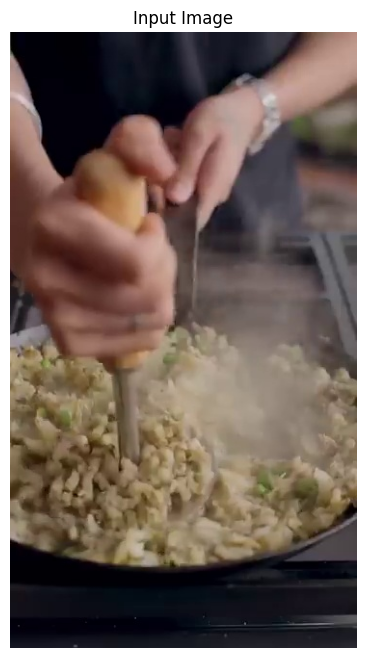


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat     Total Insoluble   Soluble Carbohydrate  Energy
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20       NaN       NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29       NaN       NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09       NaN       NaN       NaN          NaN     442
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63 0.60±0.06 0.13±0.02 0.16±0.01 0.70±0.14 0.35±0.11 0.34±0.05    3.86±0.59   85±10
                               rice flakes (oryza sativa)              6 10.36±0.53 7.44±0.35 0.85±0.13 1.14±0.11 3.46±0.32 2.65±0.34 0.81±0.12  

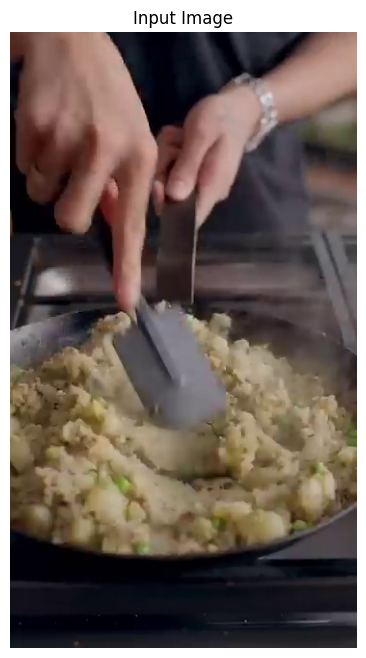


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

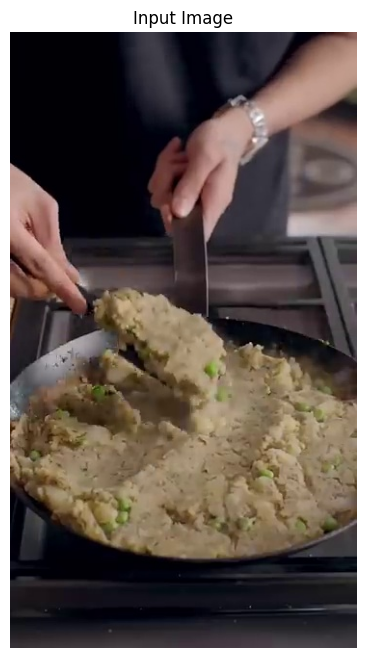


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

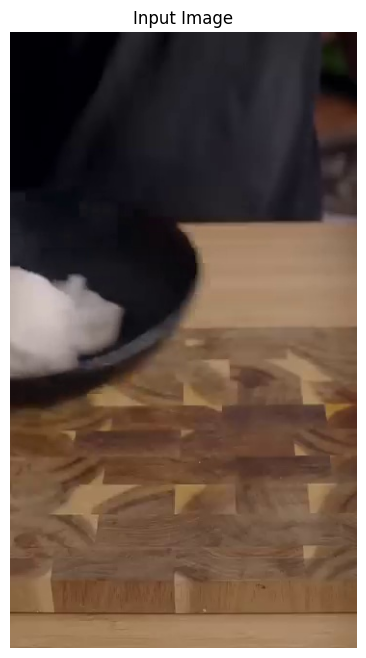


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

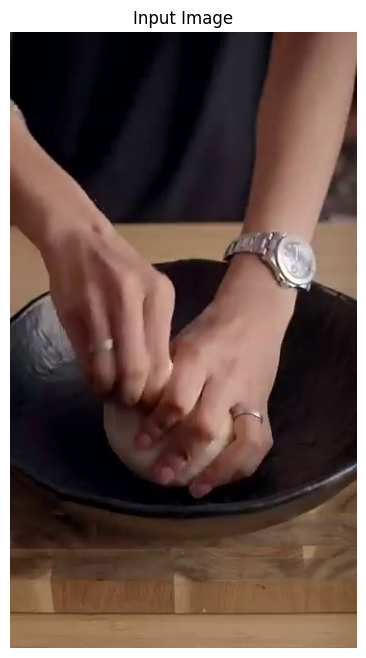


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

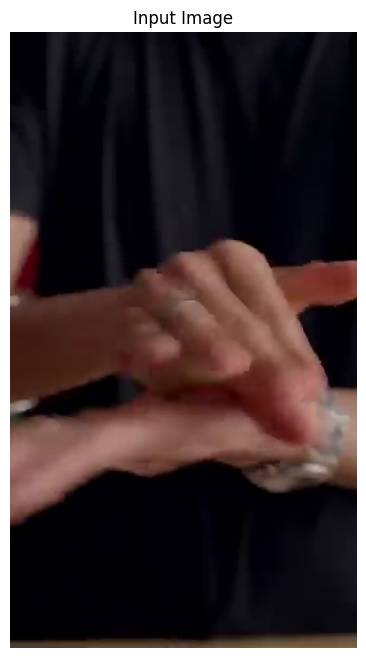


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

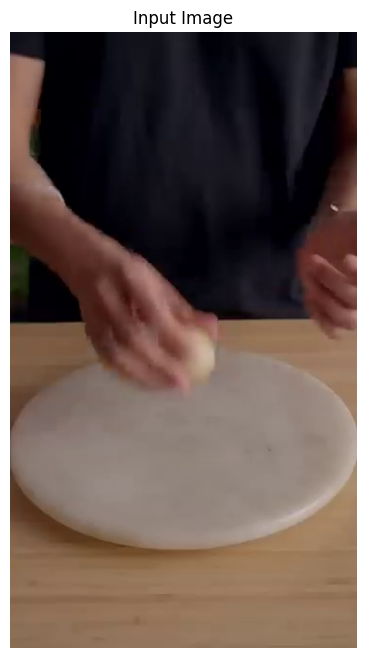


No matching ingredient details found.

Frame 1000: Predicted dish - Siddu
Ingredients: No matching dish found in the dataset.


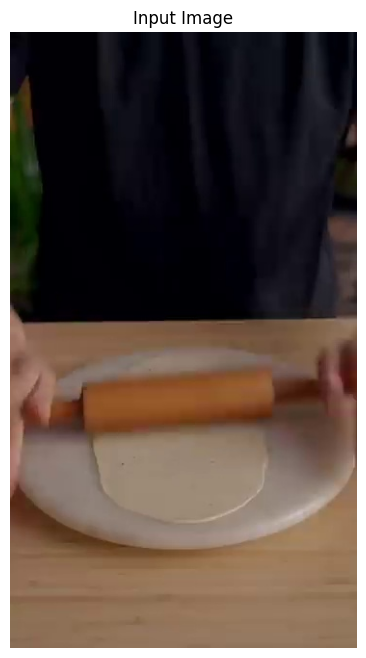


No matching ingredient details found.

Frame 1025: Predicted dish - Rasmalai
Ingredients: cardamom (elaichi) podsseeds,mixed nuts like flaked almonds pistachios,milk,sugar,lemon,condensed milk


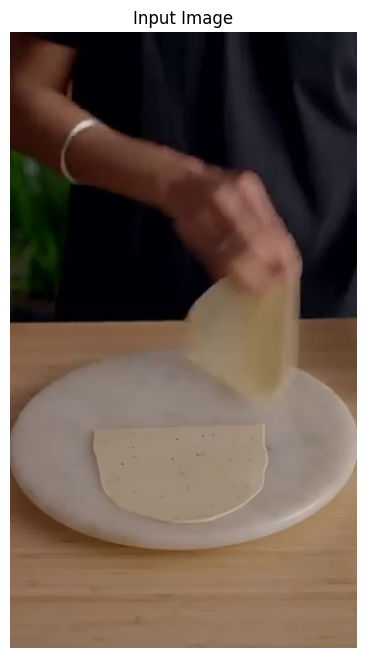


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
                                     milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20        NaN        NaN       NaN    8.39±0.71   449±9
                                         milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29        NaN        NaN       NaN    4.94±1.02  305±23
                                milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09        NaN        NaN

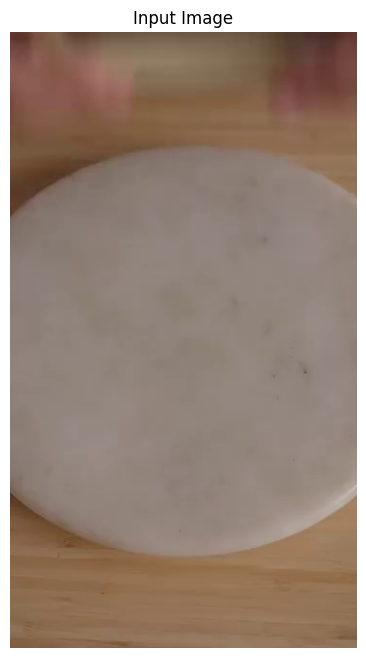


No matching ingredient details found.

Frame 1075: Predicted dish - Rasgulla
Ingredients: pistachios,milk,rose water,rasgulla syrup,rasgulla,custard powder


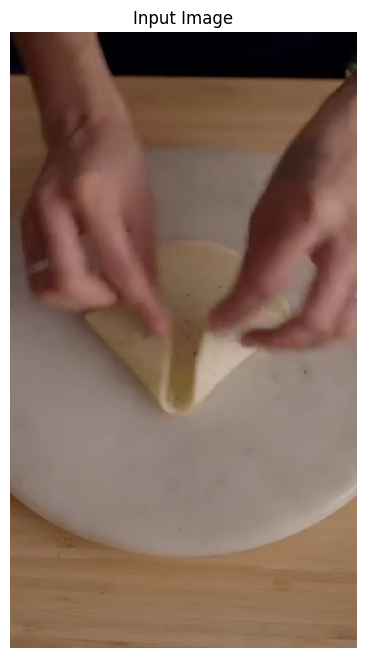


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 1100: Predicted dish - Rasgulla
Ingredients: pistachios,milk,rose water,rasgulla syrup,rasgulla,custard powder


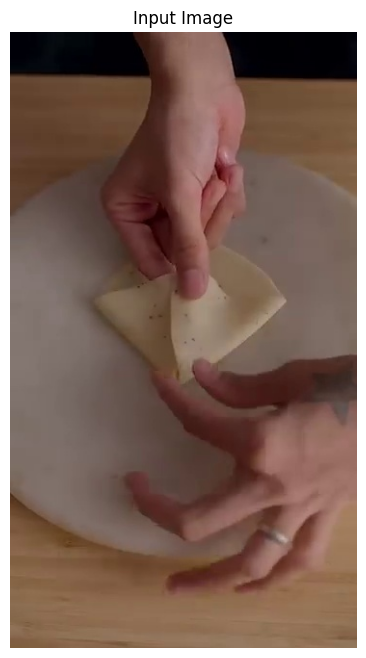


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 1125: Predicted dish - Modak
Ingredients: salt,coconut,jaggery,water,cardamom powder (elaichi),rice flour,sunflower oil


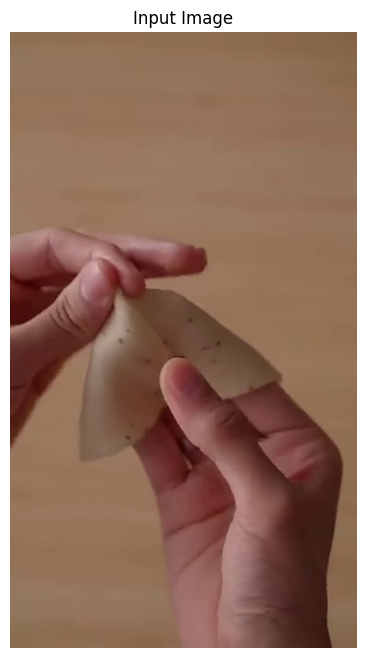


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

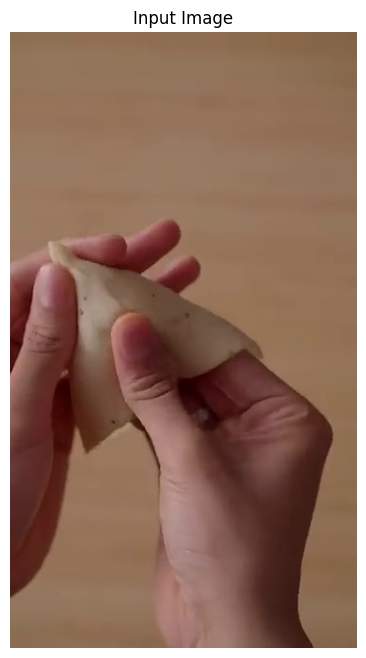


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 1175: Predicted dish - Nan Khatai
Ingredients: No matching dish found in the dataset.


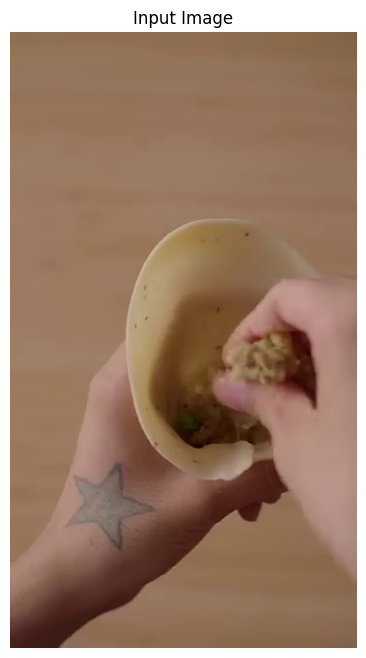


No matching ingredient details found.

Frame 1200: Predicted dish - Rasgulla
Ingredients: pistachios,milk,rose water,rasgulla syrup,rasgulla,custard powder


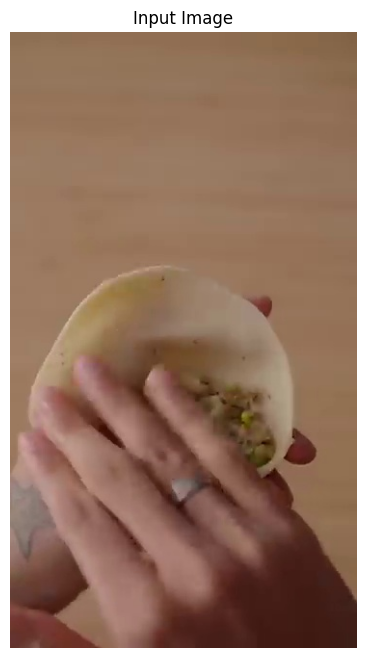


Matched Ingredient Details:

                       ing_name No. of Regions   Moisture   Protein       Ash Total Fat Total Insoluble Soluble Carbohydrate Energy
           milk, whole, buffalo              6 80.68±0.66 3.68±0.13 0.67±0.02 6.58±0.20   NaN       NaN     NaN    8.39±0.71  449±9
               milk, whole, cow              6 86.64±1.10 3.26±0.06 0.68±0.02 4.48±0.29   NaN       NaN     NaN    4.94±1.02 305±23
      milk fish (chanos chanos)              1      72.22     23.66      1.12      1.09   NaN       NaN     NaN          NaN    442
custard apple (annona squamosa)              1      71.55      1.62      0.68      0.67   5.1      3.17    1.93        20.38    414
Frame 1225: Predicted dish - Nan Khatai
Ingredients: No matching dish found in the dataset.


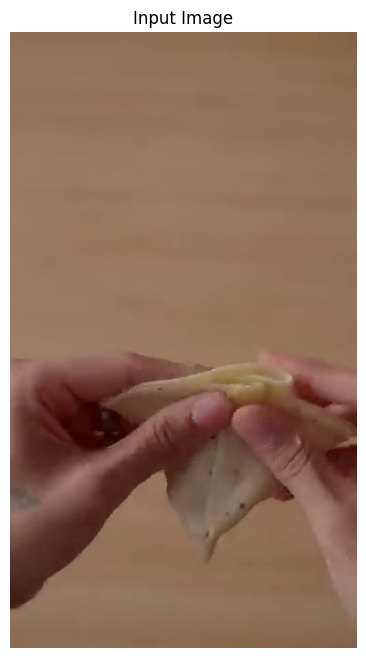


No matching ingredient details found.

Frame 1250: Predicted dish - Modak
Ingredients: salt,coconut,jaggery,water,cardamom powder (elaichi),rice flour,sunflower oil


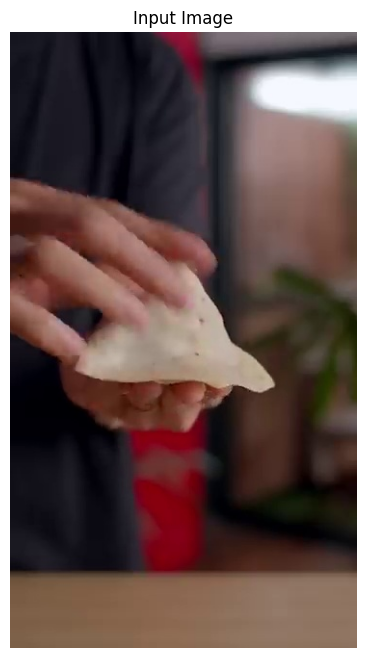


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

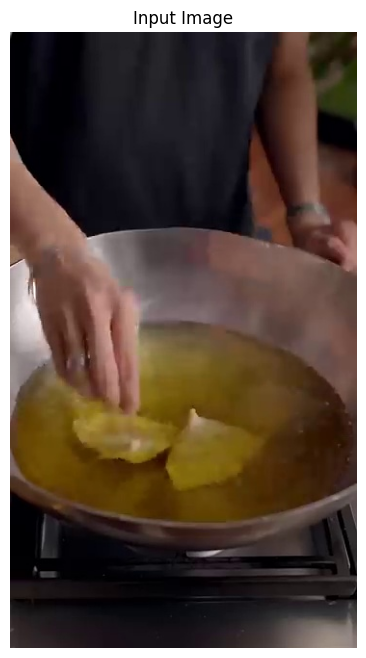


Matched Ingredient Details:

                              ing_name No. of Regions   Moisture   Protein       Ash Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
cardamom, green (elettaria cardamomum)              6 11.24±0.51 8.10±0.41 7.21±0.46 2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
cardamom, black (elettaria cardamomum)              4  6.69±0.47 6.69±0.31 7.84±0.40 2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
Frame 1300: Predicted dish - Siddu
Ingredients: No matching dish found in the dataset.


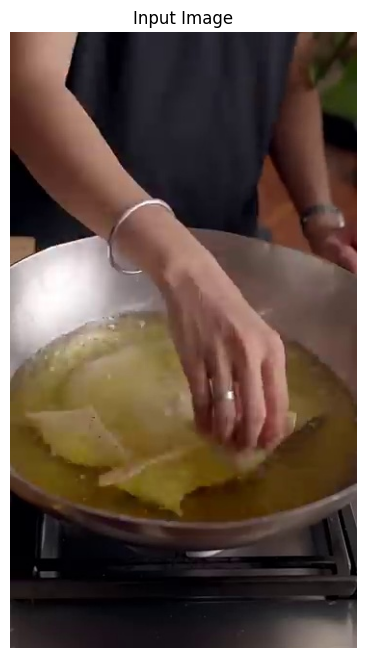


No matching ingredient details found.

Frame 1325: Predicted dish - Pani Puri
Ingredients: green moong dal black gram,sweet chutney (date tamarind),pani puris,green chutney (coriander mint),boondi


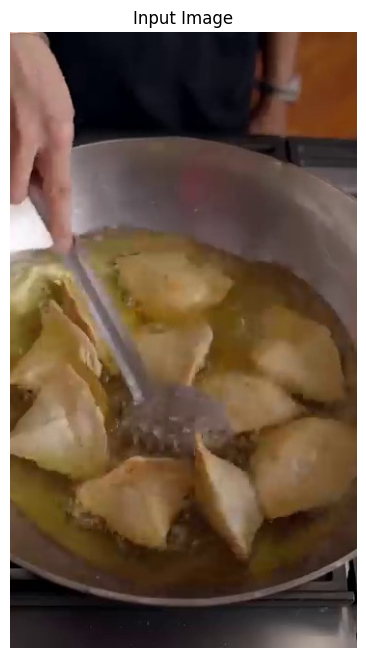


Matched Ingredient Details:

                                      ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
            green gram, dal (phaseolus aureus)              6  9.77±0.67 23.88±0.61 3.04±0.03  1.35±0.20  9.37±0.38  7.75±0.39 1.62±0.19   52.59±0.45 1363±10
          green gram, whole (phaseolus aureus)              6  9.95±0.42 22.53±0.43 3.22±0.04  1.14±0.17 17.04±0.38 14.59±0.42 2.44±0.15   46.13±0.64 1229±10
amaranth leaves, green (amaranthus gangeticus)              6 86.85±1.21  3.29±0.57 2.52±0.32  0.65±0.07  4.41±0.10  3.21±0.08 1.20±0.09    2.28±0.62  128±17
               maize, tender, sweet (zea mays)              4 74.40±0.71  4.16±0.41 0.36±0.06  1.35±0.07  3.30±0.51  2.71±0.53 0.59±0.11   16.42±0.89  405±14
             lime, sweet,pulp (citrus limetta)              6 91.32±0.33  0.76±0.09 0.47±0.03  0.20±0.06  2.07±0.11  1.33±0.04 0.74±0.08    5.18±0.37   114±5
    sweet potato, brow

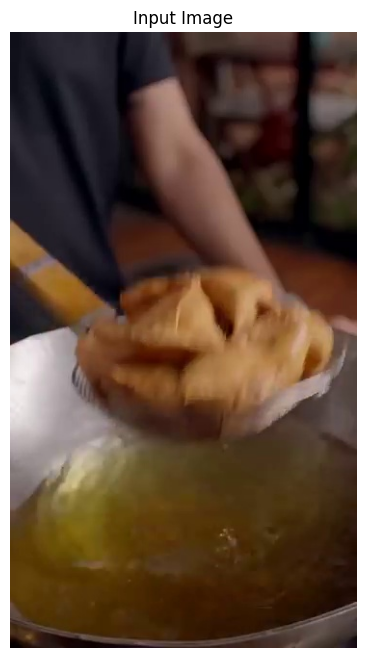


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                   cardamom, green (elettaria cardamomum)              6 11.24±0.51  8.10±0.41 7.21±0.46  2.60±0.15 23.10±0.14 20.46±0.09 2.64±0.10   47.76±0.47 1067±16
                   cardamom, black (elettaria cardamomum)              4  6.69±0.47  6.69±0.31 7.84±0.40  2.80±0.24 23.46±0.58 20.73±0.39 2.74±0.37   52.53±1.51 1132±13
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.14  0.35±0.11 0.34±0.05    3.86±0.59   85±10
             water melon, pale green (citrullus vulgaris)              6 95.33±0.22  0.59±0.03 0.12±0.01  0.16±0.01  0.78±0.11  0.40±0.07 0.38±0.08    3.02±0.21    70±4
                       water chestnut (eleocharis dulcis)              1      73.34       0.86      0.95       0.37       3.0

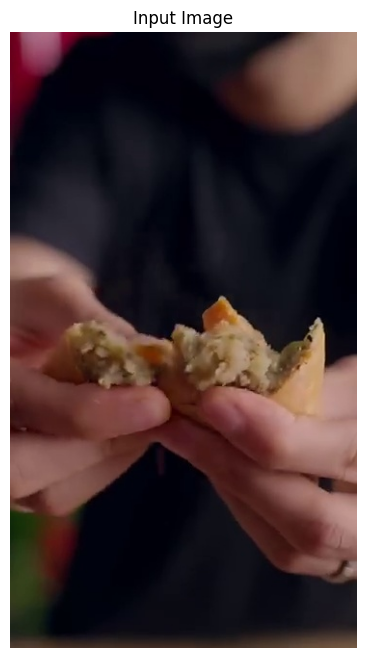


Matched Ingredient Details:

                                                 ing_name No. of Regions   Moisture    Protein       Ash  Total Fat      Total  Insoluble   Soluble Carbohydrate  Energy
                    coconut, kernal, dry (cocos nucifera)              6  3.97±0.73  7.27±0.02 1.61±0.17 63.26±0.30 15.88±0.79 14.55±0.23 1.33±0.99    8.01±1.02  2611±9
                  coconut, kernel, fresh (cocos nucifera)              6 36.14±0.36  3.84±0.04 1.93±0.15 41.38±0.42 10.42±0.28  9.43±0.24 0.99±0.07    6.30±0.43 1711±13
                                            coconut water              6 95.77±0.42  0.26±0.04 0.65±0.06  0.16±0.02        NaN        NaN       NaN    3.16±0.39    64±7
                    jaggery, cane (saccharum officinarum)              6 11.20±0.49  1.85±0.19 1.92±0.17  0.16±0.02        NaN        NaN       NaN   84.87±0.63  1480±9
water melon, dark green (sugar baby) (citrullus vulgaris)              6 94.54±0.63  0.60±0.06 0.13±0.02  0.16±0.01  0.70±0.1

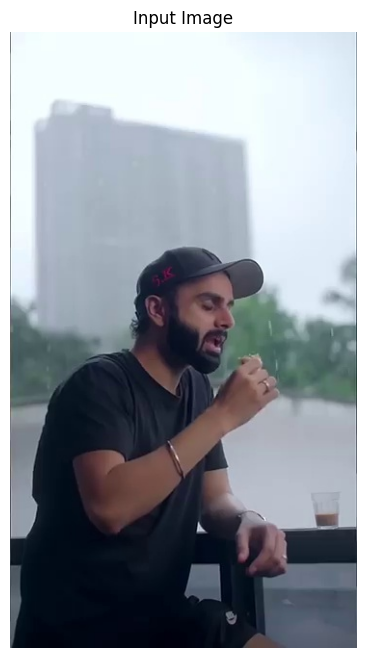


No matching ingredient details found.

Frame 1425: Predicted dish - Idli Sambhar
Ingredients: No matching dish found in the dataset.


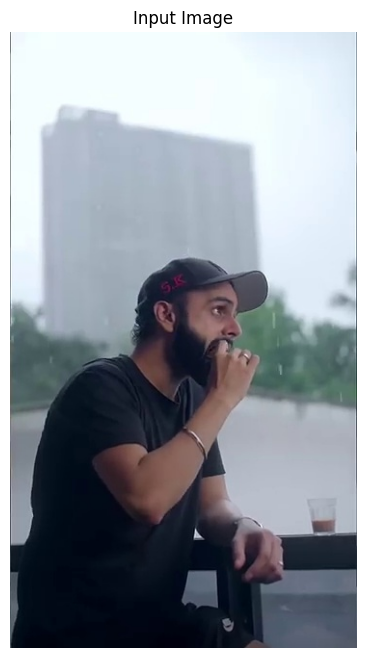


No matching ingredient details found.

Frame 1450: Predicted dish - Idli Sambhar
Ingredients: No matching dish found in the dataset.


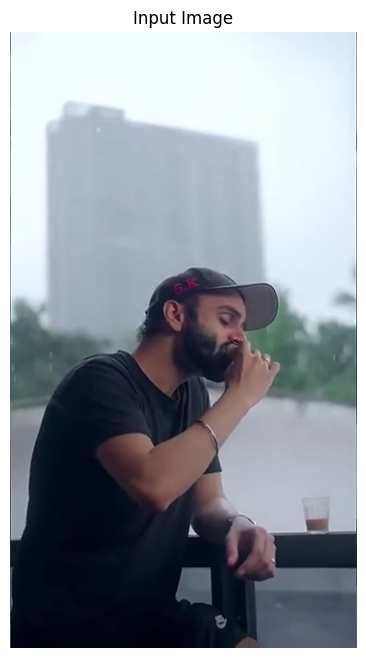


No matching ingredient details found.

Frame 1475: Predicted dish - Idli Sambhar
Ingredients: No matching dish found in the dataset.


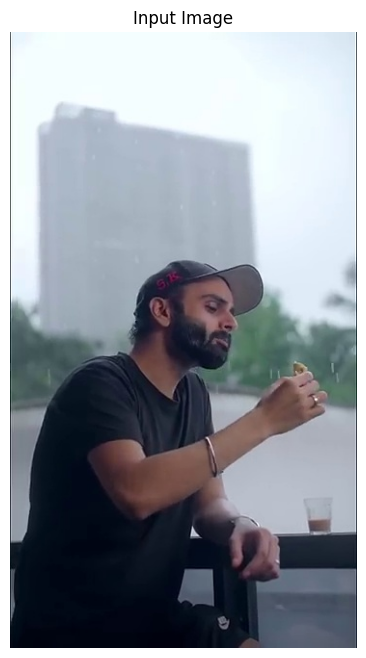


No matching ingredient details found.



In [27]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from typing import List, Tuple
from PIL import Image
import torch
import cv2
import os
from torchvision import transforms

# Define transformations
input_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

def process_ingredient(ingredient: str) -> List[str]:
    """Process an ingredient string, separating out bracketed parts if necessary."""
    ingredient = ingredient.strip()
    if '(' in ingredient and ')' in ingredient:
        main_part = ingredient.split('(')[0].strip()
        bracket_part = ingredient.split('(')[1].split(')')[0].strip()
        return [main_part, bracket_part]
    else:
        return [ingredient]

def match_ingredient_details(ingredient: str, detailed_dataset: pd.DataFrame) -> pd.DataFrame:
    """Match an ingredient with the detailed dataset and retrieve rows with the most matched data."""
    ingredient = ingredient.lower()
    detailed_dataset.iloc[:, 0] = detailed_dataset.iloc[:, 0].fillna("").astype(str).str.lower()

    matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(ingredient) + r'\b', na=False)]

    if matched_rows.empty:
        first_word = ingredient.split()[0]
        matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(first_word) + r'\b', na=False)]

    return matched_rows

def predict_dish_with_flexible_matching(model, image_path: str, transform, class_names: list, dataset: pd.DataFrame) -> Tuple[str, str]:
    """Predict the dish class for a given image and find ingredients flexibly."""
    model.eval()

    image = Image.open(image_path).convert('RGB')  # Ensure the image is RGB
    image = transform(image).unsqueeze(0)  # Apply transformations and add batch dimension
    image = image.to(device)

    with torch.no_grad():
        outputs = model(image)
        _, predicted_class_idx = torch.max(outputs, 1)

    predicted_dish_name = class_names[predicted_class_idx.item()]
    matched_rows = dataset[dataset['dish-name'].str.contains(predicted_dish_name, case=False, na=False)]

    if matched_rows.empty:
        return predicted_dish_name, "No matching dish found in the dataset."

    best_match = matched_rows.loc[matched_rows['Ingredient-count'].idxmin()]
    ingredients = best_match['Ingredients']

    return predicted_dish_name, ingredients

def display_image_and_ingredients(image_path: str, matched_df: pd.DataFrame):
    """Display the input image and the matched ingredient details in a structured format."""
    img = mpimg.imread(image_path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title("Input Image")
    plt.show()

    if not matched_df.empty:
        print("\nMatched Ingredient Details:\n")
        print(matched_df.to_string(index=False))
    else:
        print("\nNo matching ingredient details found.\n")

def process_video(video_path: str, output_folder: str, model, transform, class_names, dish_dataset, detailed_dataset):
    """
    Process a video, capture frames every second, and predict dishes in those frames.

    Args:
        video_path: Path to the video file.
        output_folder: Folder to save captured frames.
        model: Trained model.
        transform: Transformations to apply to the input image.
        class_names: List of class names corresponding to model outputs.
        dish_dataset: DataFrame with dish details.
        detailed_dataset: DataFrame with ingredient details.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get video frame rate
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process one frame every second
        if frame_count % frame_interval == 0:
            frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
            cv2.imwrite(frame_filename, frame)

            # Predict dish and retrieve ingredients
            predicted_dish, ingredients = predict_dish_with_flexible_matching(model, frame_filename, transform, class_names, dish_dataset)

            print(f"Frame {frame_count}: Predicted dish - {predicted_dish}")
            print(f"Ingredients: {ingredients}")

            # Process and display ingredient details
            ingredient_details = []
            if ingredients != "No matching dish found in the dataset.":
                for ingredient in ingredients.split(','):
                    parts = process_ingredient(ingredient)
                    for part in parts:
                        matched_rows = match_ingredient_details(part, detailed_dataset)
                        if not matched_rows.empty:
                            limited_rows = matched_rows.head(3)
                            for _, row in limited_rows.iterrows():
                                ingredient_details.append(row.to_dict())

            if ingredient_details:
                matched_df = pd.DataFrame(ingredient_details)
            else:
                matched_df = pd.DataFrame()

            display_image_and_ingredients(frame_filename, matched_df)

        frame_count += 1

    cap.release()

# Load datasets
dish_dataset = pd.read_csv('dish_ing.csv')
detailed_dataset = pd.read_csv('ing_nutrit.csv')

# User input for video processing
print("Enter the path to the video file:")
video_path = input().strip()

# Output folder for captured frames
output_folder = "captured_frames"

# Process the video and predict dishes
process_video(video_path, output_folder, model, input_transform, CLASSES, dish_dataset, detailed_dataset)


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import torch
from torchvision import transforms
from PIL import Image
from llama_cpp import Llama

# Initialize Llama model
llm = Llama.from_pretrained(
    repo_id="asbjoernrubek/mistral-7b-nutritional-coach_fp16.gguf",
    filename="mistral-7b-nutritional-coach-v0.1.gguf",
)

# Define transformations
input_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

# Function to query the Llama model for nutritional information
def get_nutritional_info(ingredients):
    """Query the Llama model for nutritional benefits/drawbacks."""
    nutritional_responses = {}
    for ingredient in ingredients.split(','):
        ingredient = ingredient.strip()
        if not ingredient:
            continue
        
        print(f"\nFetching nutritional info for: {ingredient}")
        response = llm.create_chat_completion(
            messages=[
                {
                    "role": "user",
                    "content": f"What are the nutritional benefits or drawbacks of {ingredient}?"
                },
            ]
        )
        nutritional_responses[ingredient] = response['choices'][0]['message']['content']
        print(f"Nutritional info for {ingredient}:\n{nutritional_responses[ingredient]}\n")

    return nutritional_responses

# Main function to process video and query nutritional info
def process_video_and_query_nutrition(video_path, output_folder, model, transform, class_names, dish_dataset):
    """
    Process a video frame-by-frame, predict dishes, extract ingredients, 
    and query nutritional info using the Llama model.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get video frame rate
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process one frame every second
        if frame_count % frame_interval == 0:
            frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
            cv2.imwrite(frame_filename, frame)

            # Predict dish class
            image = Image.open(frame_filename).convert('RGB')
            image_tensor = transform(image).unsqueeze(0)  # Apply transformations and add batch dimension
            image_tensor = image_tensor.to(device)

            with torch.no_grad():
                outputs = model(image_tensor)
                _, predicted_class_idx = torch.max(outputs, 1)

            predicted_dish = class_names[predicted_class_idx.item()]
            print(f"\nFrame {frame_count}: Predicted Dish - {predicted_dish}")

            # Match ingredients from dataset
            matched_rows = dish_dataset[dish_dataset['dish-name'].str.contains(predicted_dish, case=False, na=False)]
            if matched_rows.empty:
                print("No matching dish found in the dataset.")
                frame_count += 1
                continue

            # Get ingredients for the best match
            best_match = matched_rows.iloc[0]  # Pick the first match
            ingredients = best_match['Ingredients']
            print(f"Ingredients: {ingredients}")

            # Query Llama model for nutritional information of ingredients
            nutritional_info = get_nutritional_info(ingredients)

            # Display nutritional info
            for ingredient, info in nutritional_info.items():
                print(f"\nIngredient: {ingredient}")
                print(f"Nutritional Info: {info}")

        frame_count += 1

    cap.release()

# Load datasets
dish_dataset = pd.read_csv('dish_ing.csv')

# User input for video processing
print("Enter the path to the video file:")
video_path = input().strip()

# Output folder for captured frames
output_folder = "captured_frames"

# Process the video and query nutritional info
process_video_and_query_nutrition(video_path, output_folder, model, input_transform, CLASSES, dish_dataset)


llama_model_loader: loaded meta data with 24 key-value pairs and 291 tensors from /home/pranav/.cache/huggingface/hub/models--asbjoernrubek--mistral-7b-nutritional-coach_fp16.gguf/snapshots/6428d614f09450c1317b2d35e2a8e6fec0a176ab/./mistral-7b-nutritional-coach-v0.1.gguf (version GGUF V3 (latest))
llama_model_loader: Dumping metadata keys/values. Note: KV overrides do not apply in this output.
llama_model_loader: - kv   0:                       general.architecture str              = llama
llama_model_loader: - kv   1:                               general.name str              = mymistral-hf
llama_model_loader: - kv   2:                           llama.vocab_size u32              = 32000
llama_model_loader: - kv   3:                       llama.context_length u32              = 32768
llama_model_loader: - kv   4:                     llama.embedding_length u32              = 4096
llama_model_loader: - kv   5:                          llama.block_count u32              = 32
llama_model_

Enter the path to the video file:


 pp.jpg



Frame 0: Predicted Dish - Pani Puri
Ingredients: salt,cumin powder (jeera),black salt,green moong sproutsgreen moong sprouts,potato (aloo),chaat masala powder,red chilli powder,mango,sugar,pani puris,black pepper powder,mint leaves (pudina)

Fetching nutritional info for: salt


llama_perf_context_print:        load time =    4072.32 ms
llama_perf_context_print: prompt eval time =       0.00 ms /    20 tokens (    0.00 ms per token,      inf tokens per second)
llama_perf_context_print:        eval time =       0.00 ms /    82 runs   (    0.00 ms per token,      inf tokens per second)
llama_perf_context_print:       total time =  266394.42 ms /   102 tokens
Llama.generate: 14 prefix-match hit, remaining 11 prompt tokens to eval


Nutritional info for salt:
 Sodium, which is the primary component of salt, is an essential mineral for your body. It helps regulate fluid balance and is necessary for proper nerve and muscle function. However, too much sodium can lead to high blood pressure and other health issues. A moderate intake is beneficial, but many people consume more than what's recommended. How does your current diet manage sodium intake?


Fetching nutritional info for: cumin powder (jeera)


llama_perf_context_print:        load time =    4072.32 ms
llama_perf_context_print: prompt eval time =       0.00 ms /    11 tokens (    0.00 ms per token,      inf tokens per second)
llama_perf_context_print:        eval time =       0.00 ms /    98 runs   (    0.00 ms per token,      inf tokens per second)
llama_perf_context_print:       total time =  329811.22 ms /   109 tokens
Llama.generate: 14 prefix-match hit, remaining 7 prompt tokens to eval


Nutritional info for cumin powder (jeera):
 Cumin powder, also known as jeera, is a common spice used in many cuisines around the world. It contains several beneficial compounds like vitamin C, iron, and dietary fiber. However, cumin also has antimicrobial and antifungal properties which can sometimes counterbalance its nutritional value. It's important to consume it in moderation as part of a balanced diet. How does cumin fit into your current diet?


Fetching nutritional info for: black salt


In [46]:
import pandas as pd
import re
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from typing import List, Tuple
from PIL import Image
import torch
import cv2
import os
from torchvision import transforms
import torch.nn.functional as F  # For softmax

# Define transformations
input_transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match model input size
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
])

def process_ingredient(ingredient: str) -> List[str]:
    """Process an ingredient string, separating out bracketed parts if necessary."""
    ingredient = ingredient.strip()
    if '(' in ingredient and ')' in ingredient:
        main_part = ingredient.split('(')[0].strip()
        bracket_part = ingredient.split('(')[1].split(')')[0].strip()
        return [main_part, bracket_part]
    else:
        return [ingredient]

def match_ingredient_details(ingredient: str, detailed_dataset: pd.DataFrame) -> pd.DataFrame:
    """Match an ingredient with the detailed dataset and retrieve rows with the most matched data."""
    ingredient = ingredient.lower()
    detailed_dataset.iloc[:, 0] = detailed_dataset.iloc[:, 0].fillna("").astype(str).str.lower()

    matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(ingredient) + r'\b', na=False)]

    if matched_rows.empty:
        first_word = ingredient.split()[0]
        matched_rows = detailed_dataset[detailed_dataset.iloc[:, 0].str.contains(r'\b' + re.escape(first_word) + r'\b', na=False)]

    return matched_rows

def predict_dish_with_flexible_matching(model, image_path: str, transform, class_names: list, dataset: pd.DataFrame, threshold: float = 0.8) -> Tuple[str, str]:
    """Predict the dish class for a given image and find ingredients flexibly."""
    model.eval()

    image = Image.open(image_path).convert('RGB')  # Ensure the image is RGB
    image = transform(image).unsqueeze(0)  # Apply transformations and add batch dimension
    image = image.to(device)

    with torch.no_grad():
        outputs = model(image)
        probabilities = F.softmax(outputs, dim=1)  # Apply softmax to get probabilities
        confidence, predicted_class_idx = torch.max(probabilities, 1)

    confidence = confidence.item()

    # Only proceed if the confidence is above the threshold
    if confidence >= threshold:
        predicted_dish_name = class_names[predicted_class_idx.item()]
        matched_rows = dataset[dataset['dish-name'].str.contains(predicted_dish_name, case=False, na=False)]

        if matched_rows.empty:
            return predicted_dish_name, "No matching dish found in the dataset."

        best_match = matched_rows.loc[matched_rows['Ingredient-count'].idxmin()]
        ingredients = best_match['Ingredients']

        return predicted_dish_name, ingredients
    else:
        return "Low confidence", "Model's confidence is below the threshold."

def display_image_and_ingredients(image_path: str, matched_df: pd.DataFrame):
    """Display the input image and the matched ingredient details in a structured format."""
    img = mpimg.imread(image_path)
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')
    plt.title("Input Image")
    plt.show()

    if not matched_df.empty:
        print("\nMatched Ingredient Details:\n")
        print(matched_df.to_string(index=False))
    else:
        print("\nNo matching ingredient details found.\n")

def process_video(video_path: str, output_folder: str, model, transform, class_names, dish_dataset, detailed_dataset, threshold: float = 0.8):
    """
    Process a video, capture frames every second, and predict dishes in those frames.

    Args:
        video_path: Path to the video file.
        output_folder: Folder to save captured frames.
        model: Trained model.
        transform: Transformations to apply to the input image.
        class_names: List of class names corresponding to model outputs.
        dish_dataset: DataFrame with dish details.
        detailed_dataset: DataFrame with ingredient details.
        threshold: Confidence threshold for predictions.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get video frame rate
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process one frame every second
        if frame_count % frame_interval == 0:
            frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
            cv2.imwrite(frame_filename, frame)

            # Predict dish and retrieve ingredients
            predicted_dish, ingredients = predict_dish_with_flexible_matching(model, frame_filename, transform, class_names, dish_dataset, threshold)

            # Only print results if the confidence is above the threshold
            if predicted_dish != "Low confidence":
                print(f"Frame {frame_count}: Predicted dish - {predicted_dish}")
                print(f"Ingredients: {ingredients}")

                # Process and display ingredient details
                ingredient_details = []
                if ingredients != "No matching dish found in the dataset.":
                    for ingredient in ingredients.split(','):
                        parts = process_ingredient(ingredient)
                        for part in parts:
                            matched_rows = match_ingredient_details(part, detailed_dataset)
                            if not matched_rows.empty:
                                limited_rows = matched_rows.head(3)
                                for _, row in limited_rows.iterrows():
                                    ingredient_details.append(row.to_dict())

                if ingredient_details:
                    matched_df = pd.DataFrame(ingredient_details)
                else:
                    matched_df = pd.DataFrame()

                display_image_and_ingredients(frame_filename, matched_df)

        frame_count += 1

    cap.release()

# Load datasets
dish_dataset = pd.read_csv('dish_ing.csv')
detailed_dataset = pd.read_csv('ing_nutrit.csv')

# User input for video processing
print("Enter the path to the video file:")
video_path = input().strip()

# Output folder for captured frames
output_folder = "captured_frames"

# Process the video and predict dishes with a confidence threshold
process_video(video_path, output_folder, model, input_transform, CLASSES, dish_dataset, detailed_dataset, threshold=0.98)


Enter the path to the video file:


 dish2.mp4


AttributeError: 'collections.OrderedDict' object has no attribute 'eval'

In [12]:
#import ollama

In [19]:
#res = ollama.chat(
#    model='llava:7b',
#    messages=[
#        {'role': 'user',
#         'content': 'Describe the type of house and floors from image',
#         'images': ['housetest.png']
#        }
#    ]
#)

In [8]:
import cv2
import os

def process_frame_with_model(frame, frame_count, output_folder):
    """
    Save the frame, send it to the model for analysis, and print the result.
    
    Args:
        frame: The video frame to process.
        frame_count: The frame count (used for naming saved frames).
        output_folder: The folder to save the frame.
    """
    # Save the frame as an image
    frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
    cv2.imwrite(frame_filename, frame)

    # Interact with the model
    try:
        res = ollama.chat(
            model='llava:7b',
            messages=[
                {
                    'role': 'user',
                    'content': 'discribe the dish nutritional facts from the image',
                    'images': [frame_filename]
                }
            ]
        )
        # Print the model's response
        print(f"Frame {frame_count}:")
        print(res['message']['content'])
        print("-" * 50)  # Separator for readability

    except Exception as e:
        print(f"Error processing frame {frame_count}: {e}")


def process_video(video_path: str, output_folder: str):
    """
    Process a video, capture frames every second, and analyze them using the model.

    Args:
        video_path: Path to the video file.
        output_folder: Folder to save captured frames.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get video frame rate
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        # Process one frame every second
        if frame_count % frame_interval == 0:
            process_frame_with_model(frame, frame_count, output_folder)

        frame_count += 2

    cap.release()
    print("Video processing complete.")


# User input for video processing
print("Enter the path to the video file:")
video_path = input().strip()

# Output folder for captured frames
output_folder = "captured_frames"

# Process the video
process_video(video_path, output_folder)


Enter the path to the video file:


 dosa.mp4


Frame 0:
 The image displays a plate of food that appears to be an Indian snack or appetizer. It consists of two pieces of what looks like a type of bread, possibly naan or roti, which are commonly used for scooping up sauces and accompaniments in Indian cuisine. Accompanying the bread is a bowl of chutney, likely a tangy chutney commonly served with this kind of snack. There are also small containers containing condiments such as raita and chili, which add flavor to the dish. The raita could be a yogurt-based side with spices and sometimes cucumber or onions, while the chili appears to be a fresh green chutney that adds heat to the meal.

As for the nutritional facts, without specific measurements of each component, it's challenging to provide exact numbers. However, we can make some general observations:

1. **Carbohydrates**: The bread would likely be high in carbohydrates, as it is made from flour and water. Naan or roti typically have a medium to high glycemic index due to the pre

In [30]:
import cv2
import os
import json
import threading
from http.server import SimpleHTTPRequestHandler, HTTPServer
import webbrowser


def process_frame_with_model(frame, frame_count, output_folder, results):
    """
    Save the frame, send it to the model for analysis, and store the result.

    Args:
        frame: The video frame to process.
        frame_count: The frame count (used for naming saved frames).
        output_folder: The folder to save the frame.
        results: Dictionary to store results for each frame.
    """
    frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
    cv2.imwrite(frame_filename, frame)

    try:
        # Simulated response from the model
        results[frame_count] = f"Simulated nutritional information for frame {frame_count}"
    except Exception as e:
        results[frame_count] = f"Error processing frame: {e}"


def update_html(results, html_path):
    """
    Update the HTML file with the latest results.

    Args:
        results: Dictionary containing frame analysis results.
        html_path: Path to the HTML file to update.
    """
    content = """
    <!DOCTYPE html>
    <html lang="en">
    <head>
        <meta charset="UTF-8">
        <meta name="viewport" content="width=device-width, initial-scale=1.0">
        <title>Video Frame Analysis</title>
        <style>
            body {
                font-family: Arial, sans-serif;
                padding: 20px;
                background-color: #f9f9f9;
            }
            pre {
                background-color: #f4f4f4;
                border: 1px solid #ddd;
                padding: 10px;
                overflow-x: auto;
            }
            h1 {
                color: #333;
            }
        </style>
    </head>
    <body>
        <h1>Video Frame Analysis Results</h1>
        <pre>
    """
    for frame, result in results.items():
        content += f"Frame {frame}: {result}\n"
    content += """
        </pre>
    </body>
    </html>
    """
    with open(html_path, 'w') as html_file:
        html_file.write(content)


def serve_html(html_path, port=8000):
    """
    Serve the HTML file on localhost and open it in a browser.

    Args:
        html_path: Path to the HTML file to serve.
        port: Port number for the server.
    """
    def start_server():
        # Change directory only if necessary
        base_dir = os.path.dirname(html_path)
        if base_dir:
            os.chdir(base_dir)
        handler = SimpleHTTPRequestHandler
        with HTTPServer(('', port), handler) as httpd:
            print(f"Serving HTML at http://localhost:{port}/{os.path.basename(html_path)}")
            httpd.serve_forever()

    threading.Thread(target=start_server, daemon=True).start()

    # Attempt to open in browser
    url = f"http://localhost:{port}/{os.path.basename(html_path)}"
    try:
        webbrowser.open(url)
    except Exception as e:
        print(f"Unable to open browser automatically. Please visit: {url}")


def process_video(video_path: str, output_folder: str, html_path: str):
    """
    Process a video, capture frames every second, and analyze them using the model.
    Display results in real-time in a browser.

    Args:
        video_path: Path to the video file.
        output_folder: Folder to save captured frames.
        html_path: Path to the HTML file for displaying results.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))  # Get video frame rate
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0
    results = {}

    # Serve the HTML file in a browser
    serve_html(html_path)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            process_frame_with_model(frame, frame_count, output_folder, results)
            update_html(results, html_path)  # Update HTML with new results

        frame_count += 1

    cap.release()
    print("Video processing complete.")


# User input for video processing
print("Enter the path to the video file:")
video_path = input().strip()

# Output folders and files
output_folder = "captured_frames"
html_path = "video_analysis_results.html"

# Process the video
process_video(video_path, output_folder, html_path)


Enter the path to the video file:


 dish2.mp4


Exception in thread Thread-12 (start_server):
Traceback (most recent call last):
  File "/usr/lib/python3.11/threading.py", line 1045, in _bootstrap_inner
    self.run()
  File "/home/pranav/nvenv/lib/python3.11/site-packages/ipykernel/ipkernel.py", line 766, in run_closure
    _threading_Thread_run(self)
  File "/usr/lib/python3.11/threading.py", line 982, in run
    self._target(*self._args, **self._kwargs)
  File "/tmp/ipykernel_3127/2734359733.py", line 90, in start_server
  File "/usr/lib/python3.11/socketserver.py", line 456, in __init__
    self.server_bind()
  File "/usr/lib/python3.11/http/server.py", line 136, in server_bind
    socketserver.TCPServer.server_bind(self)
  File "/usr/lib/python3.11/socketserver.py", line 472, in server_bind
    self.socket.bind(self.server_address)
OSError: [Errno 98] Address already in use
gio: http://localhost:8000/video_analysis_results.html: The specified location is not supported


Video processing complete.


In [28]:
import cv2
import os
import threading
from http.server import SimpleHTTPRequestHandler, HTTPServer
import webbrowser
import ollama  # Import the Ollama library for model interaction

# Initialize Ollama API (configure if needed)


# Shared data structure to store results
results = {}

def process_frame_with_model(frame, frame_count, output_folder, html_path):
    """
    Save the frame, send it to the model for analysis, and update results.

    Args:
        frame: The video frame to process.
        frame_count: The frame count (used for naming saved frames).
        output_folder: The folder to save the frame.
        html_path: Path to the HTML file to update results.
    """
    # Save the frame as an image
    frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
    cv2.imwrite(frame_filename, frame)

    # Interact with the model
    try:
        response = ollama.chat(
            model='llava:7b',
            messages=[
                {
                    'role': 'user',
                    'content': 'Describe the dish and provide its nutritional facts from the image.',
                    'images': [frame_filename]
                }
            ]
        )
        result = response['message']['content']
        results[frame_count] = result
    except Exception as e:
        results[frame_count] = f"Error processing frame: {e}"

    # Update the HTML file with the latest results
    update_html(results, html_path)


def update_html(results, html_path):
    """
    Update the HTML file with the latest results.

    Args:
        results: Dictionary of frame analysis results.
        html_path: Path to the HTML file.
    """
    content = """
    <!DOCTYPE html>
    <html lang="en">
    <head>
        <meta charset="UTF-8">
        <meta name="viewport" content="width=device-width, initial-scale=1.0">
        <title>Video Frame Analysis</title>
        <style>
            body {
                font-family: Arial, sans-serif;
                margin: 20px;
                background-color: #f4f4f9;
            }
            h1 {
                color: #333;
            }
            .result {
                padding: 10px;
                margin-bottom: 10px;
                border: 1px solid #ddd;
                background: #fff;
            }
            img {
                max-width: 100%;
                height: auto;
            }
        </style>
    </head>
    <body>
        <h1>Video Frame Analysis Results</h1>
    """
    for frame, result in results.items():
        content += f"""
        <div class="result">
            <strong>Frame {frame}:</strong>
            <img src="captured_frames/frame_{frame}.jpg" alt="Frame {frame}">
            <p>{result}</p>
        </div>
        """
    content += """
    </body>
    </html>
    """
    with open(html_path, 'w') as file:
        file.write(content)


def serve_html(html_path, port=0):
    """
    Serve the HTML file on localhost and open it in a browser.

    Args:
        html_path: Path to the HTML file.
        port: Port number to serve on. If 0, an available port is picked.
    """
    def start_server(port):
        base_dir = os.path.dirname(html_path)
        if base_dir:
            os.chdir(base_dir)
        handler = SimpleHTTPRequestHandler
        with HTTPServer(('', port), handler) as server:
            assigned_port = server.server_address[1]  # Get the assigned port
            url = f"http://localhost:{assigned_port}/{os.path.basename(html_path)}"
            print(f"Serving at {url}")
            webbrowser.open(url)
            server.serve_forever()

    # If port is 0, let the OS select an available port
    if port == 0:
        with HTTPServer(('', 0), SimpleHTTPRequestHandler) as temp_server:
            port = temp_server.server_address[1]  # Get an available port

    threading.Thread(target=start_server, args=(port,), daemon=True).start()


def process_video(video_path, output_folder, html_path):
    """
    Process video frames and analyze them using the model.

    Args:
        video_path: Path to the video file.
        output_folder: Folder to save frames.
        html_path: Path to the HTML file for displaying results.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0

    # Serve HTML
    serve_html(html_path)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            process_frame_with_model(frame, frame_count, output_folder, html_path)

        frame_count += 1

    cap.release()
    print("Video processing complete.")


# User input
print("Enter the path to the video file:")
video_path = input().strip()

output_folder = "captured_frames"
html_path = "video_results.html"

# Process the video
process_video(video_path, output_folder, html_path)


Enter the path to the video file:


 dish2.mp4


Serving at http://localhost:39293/video_results.html


gio: http://localhost:39293/video_results.html: The specified location is not supported


Video processing complete.


127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /video_results.html HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /captured_frames/frame_175.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /captured_frames/frame_150.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /captured_frames/frame_0.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /captured_frames/frame_50.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /captured_frames/frame_75.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:52] "GET /captured_frames/frame_25.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:53] "GET /captured_frames/frame_100.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:53] "GET /captured_frames/frame_125.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:53] "GET /captured_frames/frame_200.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:53] "GET /captured_frames/frame_250.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:53] 

In [27]:
import cv2
import os
import threading
from http.server import SimpleHTTPRequestHandler, HTTPServer
import webbrowser

# Shared data structure to store results
results = {}

def process_frame_with_model(frame, frame_count, output_folder, html_path):
    """
    Save the frame, send it to the model for analysis, and update results.

    Args:
        frame: The video frame to process.
        frame_count: The frame count (used for naming saved frames).
        output_folder: The folder to save the frame.
        html_path: Path to the HTML file to update results.
    """
    frame_filename = os.path.join(output_folder, f"frame_{frame_count}.jpg")
    cv2.imwrite(frame_filename, frame)

    # Simulate model interaction and response (replace with actual model call)
    try:
        # Replace with actual model call
        # For now, simulated response:
        simulated_response = f"The image displays a frame of video {frame_count}. Nutritional facts are not available."
        results[frame_count] = simulated_response
    except Exception as e:
        results[frame_count] = f"Error processing frame {frame_count}: {e}"

    # Update the HTML file with the latest results
    update_html(results, html_path)


def update_html(results, html_path):
    """
    Update the HTML file with the latest results.

    Args:
        results: Dictionary of frame analysis results.
        html_path: Path to the HTML file.
    """
    content = """
    <!DOCTYPE html>
    <html lang="en">
    <head>
        <meta charset="UTF-8">
        <meta name="viewport" content="width=device-width, initial-scale=1.0">
        <title>Video Frame Analysis</title>
        <style>
            body {
                font-family: Arial, sans-serif;
                margin: 20px;
                background-color: #f4f4f9;
            }
            h1 {
                color: #333;
            }
            .result {
                padding: 10px;
                margin-bottom: 10px;
                border: 1px solid #ddd;
                background: #fff;
            }
            .image {
                max-width: 100%;
                height: auto;
                margin-bottom: 10px;
            }
        </style>
    </head>
    <body>
        <h1>Video Frame Analysis Results</h1>
    """
    for frame, result in results.items():
        content += f"""
        <div class="result">
            <strong>Frame {frame}:</strong>
            <br>
            <img src="captured_frames/frame_{frame}.jpg" alt="Frame {frame}" class="image">
            <p>{result}</p>
        </div>
        """
    content += """
    </body>
    </html>
    """
    with open(html_path, 'w') as file:
        file.write(content)


def serve_html(html_path, port=0):
    """
    Serve the HTML file on localhost and open it in a browser.

    Args:
        html_path: Path to the HTML file.
        port: Port number to serve on. If 0, an available port is picked.
    """
    def start_server(port):
        base_dir = os.path.dirname(html_path)
        if base_dir:
            os.chdir(base_dir)
        handler = SimpleHTTPRequestHandler
        with HTTPServer(('', port), handler) as server:
            assigned_port = server.server_address[1]  # Get the assigned port
            url = f"http://localhost:{assigned_port}/{os.path.basename(html_path)}"
            print(f"Serving at {url}")
            webbrowser.open(url)
            server.serve_forever()

    # If port is 0, let the OS select an available port
    if port == 0:
        with HTTPServer(('', 0), SimpleHTTPRequestHandler) as temp_server:
            port = temp_server.server_address[1]  # Get an available port

    threading.Thread(target=start_server, args=(port,), daemon=True).start()


def process_video(video_path, output_folder, html_path):
    """
    Process video frames and analyze them using the model.

    Args:
        video_path: Path to the video file.
        output_folder: Folder to save frames.
        html_path: Path to the HTML file for displaying results.
    """
    os.makedirs(output_folder, exist_ok=True)
    cap = cv2.VideoCapture(video_path)

    frame_rate = int(cap.get(cv2.CAP_PROP_FPS))
    frame_interval = frame_rate  # Process one frame per second

    frame_count = 0

    # Serve HTML
    serve_html(html_path)

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if frame_count % frame_interval == 0:
            process_frame_with_model(frame, frame_count, output_folder, html_path)

        frame_count += 1

    cap.release()
    print("Video processing complete.")


# User input
print("Enter the path to the video file:")
video_path = input().strip()

output_folder = "captured_frames"
html_path = "video_results.html"

# Process the video
process_video(video_path, output_folder, html_path)


Enter the path to the video file:


 dish2.mp4


Serving at http://localhost:45009/video_results.html


gio: http://localhost:45009/video_results.html: The specified location is not supported


Video processing complete.


127.0.0.1 - - [11/Apr/2025 12:34:37] "GET /video_results.html HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:37] "GET /captured_frames/frame_0.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:37] "GET /captured_frames/frame_25.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:37] "GET /captured_frames/frame_50.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:37] "GET /captured_frames/frame_75.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] "GET /captured_frames/frame_100.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] "GET /captured_frames/frame_125.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] "GET /captured_frames/frame_150.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] "GET /captured_frames/frame_175.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] "GET /captured_frames/frame_200.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] "GET /captured_frames/frame_225.jpg HTTP/1.1" 200 -
127.0.0.1 - - [11/Apr/2025 12:34:38] 